# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>1. Import Library</b></div>

<div style="border-radius:10px; border: #FFA500 solid; padding: 15px; font-size:100%;">

📌 **Experimental Parameters**
- `CLAHE(Contrast Limited Adaptive Histogram Equalization)
    
- `Image Size`: 256X256
    

- `Label Smoothing`: 0.2
    
- `Loss`: CategorialCrossEntropy
    
- `Fold`: SKF(n_splits=5) But, Only Traininig Fold1
    
- `Weak Augment`: HFlip(p=0.5)
    
- `Strong Augment`: X
  
- `BackBone Model`: TF ResNet18
    
- `Freezing Layer`: 10% Layers
    
- `Batch Size`: 16
    
- `Learning Rate`: 1e-3
    
- `Epoch`: 10
    
- `Optimizer`: Adam


In [1]:
import gc 
import ctypes
import random
from tqdm import tqdm
from collections import defaultdict

import os
import sys
import pickle

## Tensorflow Setting
import tensorflow as tf
from tensorflow.keras import *
import tensorflow.keras.backend as K, gc

os.environ['CUDA_IS_VISIBLE'] = '0,1'
print('tensorflow version: ', tf.__version__)

import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from glob import glob
import cv2
from PIL import Image

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import KFold, StratifiedKFold,GroupKFold
from sklearn.model_selection import train_test_split

import warnings 
import albumentations as albu
warnings.filterwarnings('ignore')

## GPU Settings
gpus = tf.config.list_physical_devices('GPU')
if len(gpus) <=1:
    strategy = tf.distribute.OneDeviceStrategy(device='/gpu:0')
    print(f'Using {len(gpus)} GPUs')
else: 
    strategy = tf.distribute.MirroredStrategy()
    print(f'Using {len(gpus)} GPUs')
    
LOAD_MODELS_FROM = None

2024-08-19 18:59:46.007021: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-19 18:59:46.007139: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-19 18:59:46.159209: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


tensorflow version:  2.15.0
Using 2 GPUs


In [2]:
def clean_memory():
    # malloc_trim: 현재 사용되지 않는 메모리를 시스템에서 다시 반환함0
    ctypes.CDLL('libc.so.6').malloc_trim(0)
    gc.collect()
clean_memory()

In [3]:
def seed_everything(seed):
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.random.set_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
seed_everything(42)

In [4]:
MIX = True
if MIX: 
    tf.config.optimizer.set_experimental_options({'auto_mixed_precision':True})
    print('Mixed Precision enabled')
else: 
    print('Using full precision')

Mixed Precision enabled


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>2. Road and Read Data</b></div>

In [5]:
df = pd.read_csv('/kaggle/input/data/Data_Entry_2017.csv')
df = df.drop(columns='Unnamed: 11')
df = df[~df['Finding Labels'].str.contains('\|')]
df = df.reset_index(drop=True)
print(f'Shape of DataFrame: {df.shape}')
df.head(10)

Shape of DataFrame: (91324, 11)


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143
1,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171
2,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143
3,00000003_001.png,Hernia,1,3,74,F,PA,2500,2048,0.168,0.168
4,00000003_002.png,Hernia,2,3,75,F,PA,2048,2500,0.168,0.168
5,00000003_004.png,Hernia,4,3,77,F,PA,2500,2048,0.168,0.168
6,00000003_005.png,Hernia,5,3,78,F,PA,2686,2991,0.143,0.143
7,00000003_006.png,Hernia,6,3,79,F,PA,2992,2991,0.143,0.143
8,00000003_007.png,Hernia,7,3,80,F,PA,2582,2905,0.143,0.143
9,00000005_000.png,No Finding,0,5,69,F,PA,2048,2500,0.168,0.168


In [6]:
%%time
tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','images', '*.png'))}    
    
df['path'] = df['Image Index'].map(tmp)

CPU times: user 574 ms, sys: 59.6 ms, total: 633 ms
Wall time: 2.16 s


#### Loading Pneumonia
___

- width: 1200
- height: 825

In [7]:
df_pneumonia = pd.DataFrame()
df_pneumonia['Image Index'] = os.listdir('/kaggle/input/chest-xray-pneumonia/chest_xray/train/PNEUMONIA/')
df_pneumonia['Finding Labels'] = 'Pneumonia'

tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','train','*','*.jpeg'))}        
df_pneumonia['path'] = df_pneumonia['Image Index'].map(tmp)

df = pd.concat([df, df_pneumonia])
df = df.reset_index(drop=True)

#### Loading tuberculosis
___
- width: 512
- height: 512

In [8]:
df_tuberculosis = pd.DataFrame()
df_tuberculosis['Image Index'] = os.listdir('/kaggle/input/tuberculosis-tb-chest-xray-dataset/TB_Chest_Radiography_Database/Tuberculosis/')
df_tuberculosis['Finding Labels'] = 'Tuberculosis'

tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','*','*.png'))}        
df_tuberculosis['path'] = df_tuberculosis['Image Index'].map(tmp)

df = pd.concat([df, df_tuberculosis])
df = df.reset_index(drop=True)

#### Load Covid-19
___

- height: 825
- width: 1200

In [9]:
train_covid = pd.DataFrame()
train_covid['Image Index'] = os.listdir('/kaggle/input/chest-xray-pneumoniacovid19tuberculosis/train/COVID19/')
test_covid = pd.DataFrame()
test_covid['Image Index'] = os.listdir('/kaggle/input/chest-xray-pneumoniacovid19tuberculosis/test/COVID19/')
df_covid = pd.concat([train_covid, test_covid])
df_covid['Finding Labels'] = 'Covid'

tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle', 'input', '*','*','*','*.jpg'))}        
df_covid['path'] = df_covid['Image Index'].map(tmp)

df = pd.concat([df, df_covid])
df = df.reset_index(drop=True)
df = df[['Image Index','Finding Labels', 'path','View Position']]

In [10]:
df_1 = pd.concat([df[df['Finding Labels'] == 'Edema'].sample(500, random_state=42)])
df_2 = pd.concat([df[df['Finding Labels'] == 'No Finding'].sample(500, random_state=42)])
df_3 = pd.concat([df[df['Finding Labels'] == 'Pneumonia'].sample(500, random_state=42)])
df_4 = pd.concat([df[df['Finding Labels'] == 'Tuberculosis'].sample(500, random_state=42)])
df_5 = pd.concat([df[df['Finding Labels'] == 'Cardiomegaly'].sample(500, random_state=42)])
df_6 = pd.concat([df[df['Finding Labels'] == 'Emphysema'].sample(500, random_state=42)])
df_7 = pd.concat([df[df['Finding Labels'] == 'Covid'].sample(500, random_state=42)])
df_8 = pd.concat([df[df['Finding Labels'] == 'Effusion'].sample(500, random_state=42)])
df_9 = pd.concat([df[df['Finding Labels'] == 'Atelectasis'].sample(500, random_state=42)])
df_all = [df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8,df_9]

df = pd.concat(df_all)
df = df.reset_index(drop=True)

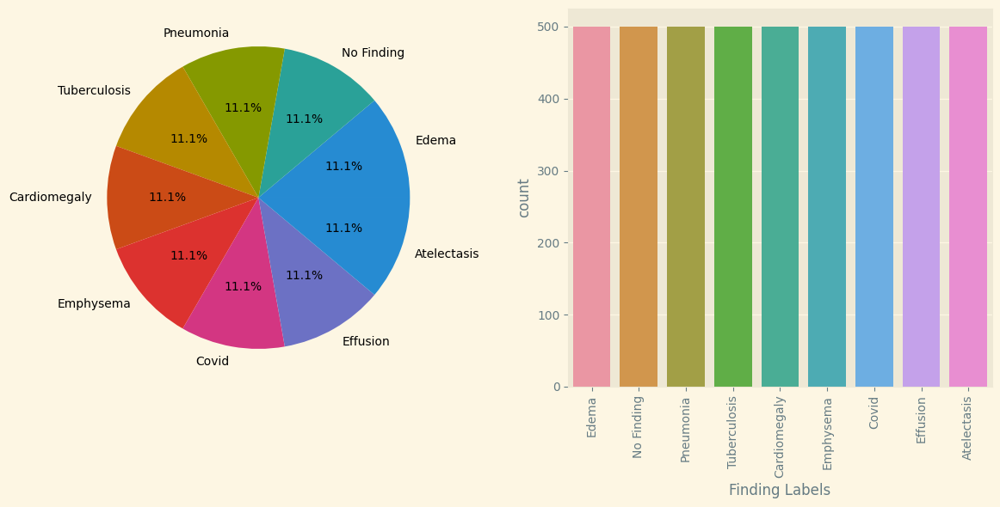

In [11]:
label_counts = df['Finding Labels'].value_counts()

plt.style.use('Solarize_Light2')

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.pie(df['Finding Labels'].value_counts(), labels=label_counts.index, autopct='%.1f%%')
# plt.legend()
plt.subplot(1,2,2)
sns.countplot(x=df['Finding Labels'], order= label_counts.index)
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

**Train & Test Split**

In [12]:
df_train, df_test = train_test_split(df, test_size=0.2, shuffle=True, random_state=42)
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

**One Hot Encoding**

In [13]:
for col in df['Finding Labels'].unique():
    df_test[col] = np.where(df_test['Finding Labels'].str.contains(col), 1.0, 0.0).astype('float32')
    df_train[col] = np.where(df_train['Finding Labels'].str.contains(col), 1.0, 0.0).astype('float32')
TARGET = df_train.columns[-len(df_all):].tolist()

In [14]:
TARGET

['Edema',
 'No Finding',
 'Pneumonia',
 'Tuberculosis',
 'Cardiomegaly',
 'Emphysema',
 'Covid',
 'Effusion',
 'Atelectasis']

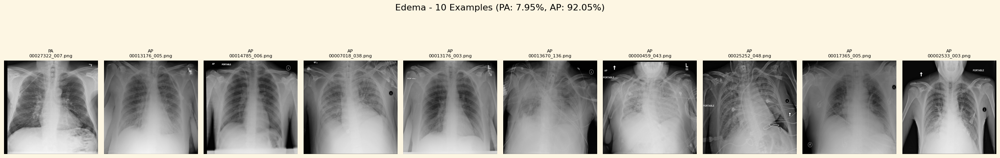

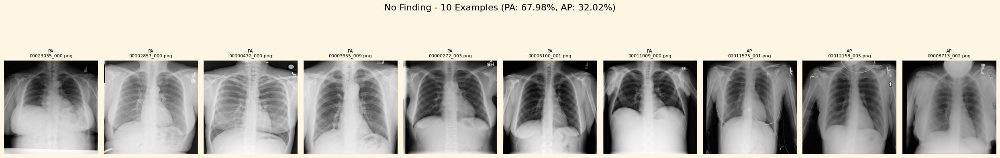

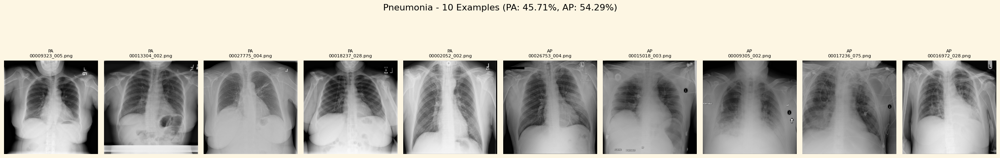

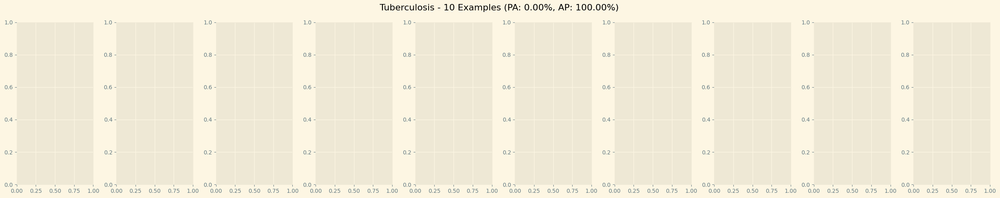

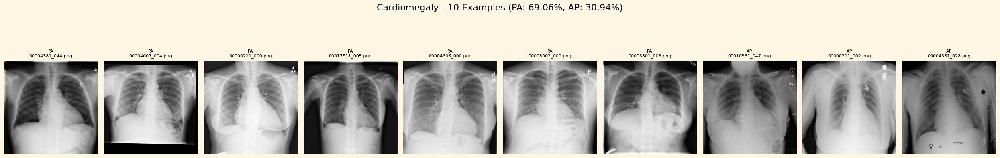

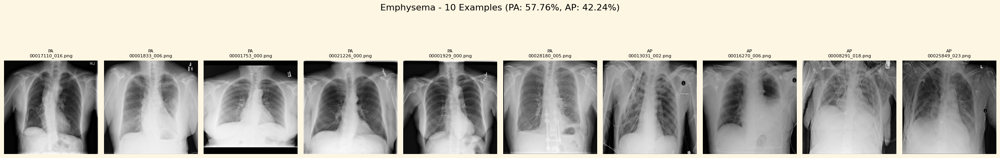

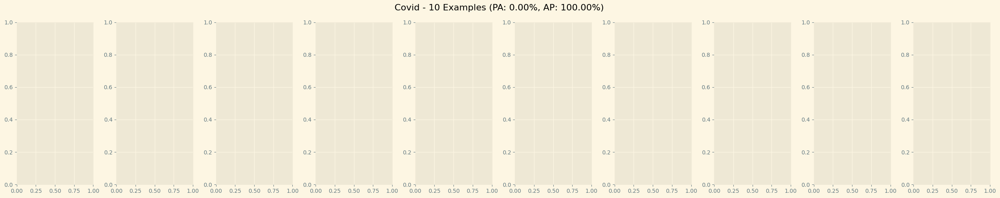

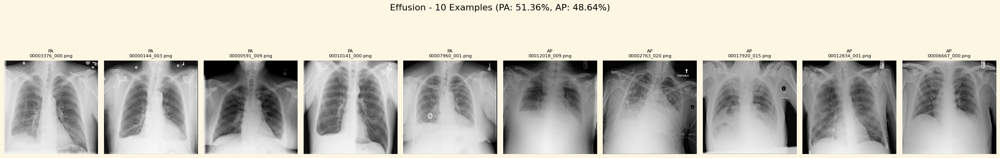

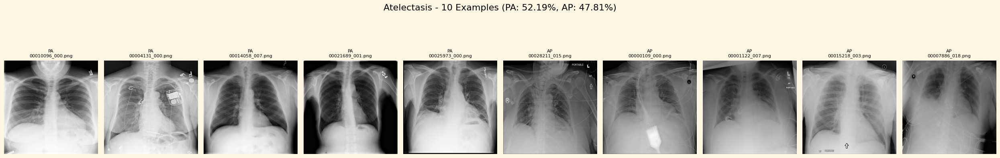

In [15]:
from PIL import Image
import math
import matplotlib.pyplot as plt
import pandas as pd

# PA와 AP 이미지 분리 / 부족한 경우 다른 뷰에서 채우기
# PA 이미지를 먼저, 그 다음 AP 이미지 나열

def plot_images_for_label(label, df, n=10):
    label_images = df[df['Finding Labels'].str.contains(label, na=False)]
    
    pa_images = label_images[label_images['View Position'] == 'PA']
    ap_images = label_images[label_images['View Position'] == 'AP']    
    total_images = len(pa_images) + len(ap_images)
    pa_ratio = len(pa_images) / total_images if total_images > 0 else 0
    ap_ratio = 1 - pa_ratio
    pa_count = round(n * pa_ratio)
    ap_count = n - pa_count
    selected_pa = pa_images.sample(min(pa_count, len(pa_images)))
    selected_ap = ap_images.sample(min(ap_count, len(ap_images)))
    
    if len(selected_pa) < pa_count:
        selected_ap = pd.concat([selected_ap, ap_images.sample(min(pa_count - len(selected_pa), len(ap_images)))])
    elif len(selected_ap) < ap_count:
        selected_pa = pd.concat([selected_pa, pa_images.sample(min(ap_count - len(selected_ap), len(pa_images)))])
    
    selected_images = pd.concat([selected_pa, selected_ap])
    
    cols = 10
    rows = math.ceil(n / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(25, 5*rows))
    fig.suptitle(f'{label} - {n} Examples (PA: {pa_ratio:.2%}, AP: {ap_ratio:.2%})', fontsize=16)
    
    for idx, (_, row) in enumerate(selected_images.iterrows()):
        if idx >= n:
            break
        img = Image.open(row['path'])
        if rows > 1:
            ax = axes[idx // cols, idx % cols]
        else:
            ax = axes[idx]
        ax.imshow(img, cmap='gray')
        ax.axis('off')
        ax.set_title(f"{row['View Position']}\n{row['Image Index']}", fontsize=8)
    
    for idx in range(n, rows * cols):
        if rows > 1:axes[idx // cols, idx % cols].axis('off')
        else:axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

for label in TARGET:
    plot_images_for_label(label, df_train, n=10)  # n을 원하는 숫자로 변경 가능

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>3. Build DataGenerator</b></div>

In [16]:
import albumentations as albu
print(albu.__version__)

1.4.0


In [17]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=16, shuffle=False, augment1=False, augment2=False, preprocess=None, 
                 clahe_clip_limit=2.0, clahe_tile_grid_size=(4,4)):
        super().__init__()
        self.data = data
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augment1 = augment1
        self.augment2 = augment2
        self.on_epoch_end()
        self.preprocess = preprocess
        self.clahe = cv2.createCLAHE(clipLimit=clahe_clip_limit, tileGridSize=clahe_tile_grid_size)
        
    def __len__(self):
        
        # Drop_Last = False
        ct = int(np.ceil(len(self.data)/self.batch_size))
        return ct
    
    def __getitem__(self,index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        X, y = self.__data_generation(indexes)
        if self.preprocess != None: X = self.preprocess(X)
        if self.augment1: X = self.__augment1(X)
        if self.augment2: X = self.__augment2(X)
        return X,y
    
    def on_epoch_end(self,):
        self.indexes = np.arange(len(self.data))
        if self.shuffle: np.random.shuffle(self.indexes)
        
    def __data_generation(self, indexes):
        
        X = np.zeros((len(indexes),256,256,3), dtype='float32') 
        y = np.zeros((len(indexes),len(TARGET)), dtype='float32')
        
        for j,i in enumerate(indexes):
            row = self.data.iloc[i]
            path = row['path']
            img = Image.open(path).convert('L')
            img = img.resize((256,256), Image.Resampling.LANCZOS) # DownSampling
            img = np.array(img) # PIL Object -> np.array(uint8)
            img = self.clahe.apply(img)
            img = np.expand_dims(img, axis=-1)
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) 
            
            # FillNaN
            m = np.nanmean(img)
            img = np.nan_to_num(img, nan=m)
            
            X[j,:,:] = img
            y[j,] = row[TARGET]
            
        return X,y
    
    def __augment1(self, img_batch):
        
        composition = albu.Compose([
            albu.HorizontalFlip(p=0.5),            
            
        ])
        
        for i in range(img_batch.shape[0]):
            img = composition(image=img_batch[i,])['image']
            img_batch[i,] = img
            
        return img_batch
    
    
    def __augment2(self, img_batch, mixup_prob=0.1):
        batch_size, height, width, channels = img_batch.shape

        idx = np.random.permutation(batch_size)
        lam = np.random.beta(2.0, 2.0) 
        
        for i in range(batch_size):
            if np.random.rand() <= mixup_prob:  
                j = idx[i]
            
                img_batch[i] = img_batch[i] * lam + img_batch[j] * (1-lam)
        
        return img_batch


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>4. Build ResNet Model</b></div>

**Install ResNet**

In [18]:
!pip install -q git+https://github.com/qubvel/classification_models.git

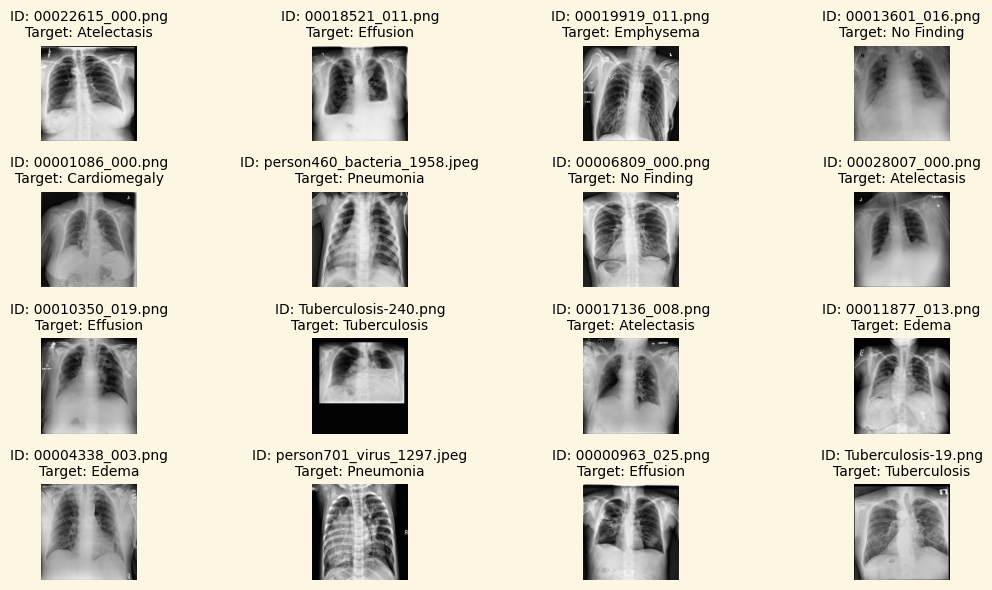

In [19]:
from classification_models.tfkeras import Classifiers

resnet18, preprocess_input = Classifiers.get('resnet18')

ROWS = 4; COLS = 4; BATCHES = 1

gen = DataGenerator(df_train, batch_size=16, shuffle=False, augment1=True, augment2=False, preprocess=None,
                    clahe_clip_limit=2.0, clahe_tile_grid_size=(4,4))

for i, (x,y) in enumerate(gen):
    plt.figure(figsize=(12,6))
    for j in range(ROWS):
        for k in range(COLS):
            plt.subplot(ROWS, COLS, j*COLS+k+1)
            img_id = df_train.iloc[i*16+j*COLS+k]['Image Index']
            plt.title(f'ID: {img_id}\nTarget: {df_train.iloc[i*16+j*COLS+k]["Finding Labels"]}', size=10)
            img = x[j*COLS+k,:,:,:3]
            img = img.astype('uint8')
            plt.imshow(img)
            plt.axis('off')
    plt.tight_layout()
    plt.show()
    if i==BATCHES-1: break

#### Macro F1_Score

In [20]:
def f1_score(y_true, y_pred):
    # Calculate the F1 score for each class
    f1_scores = []
    num_classes = K.int_shape(y_pred)[-1]  # (batch_size, output_dims = num_classes)
    
    # Get the true and predicted class indices
    y_true = K.argmax(y_true, axis=-1)
    y_pred = K.argmax(y_pred, axis=-1) # For Label Smoothing(in CCE)

    for i in range(num_classes):
        true_positives = K.sum(K.cast(tf.logical_and(K.equal(y_true, i), K.equal(y_pred, i)), dtype=tf.float32))
        possible_positives = K.sum(K.cast(K.equal(y_true, i), dtype=tf.float32))
        predicted_positives = K.sum(K.cast(K.equal(y_pred, i), dtype=tf.float32))

        recall = true_positives / (possible_positives + K.epsilon())
        precision = true_positives / (predicted_positives + K.epsilon())
        
        f1_score = 2 * ((precision * recall) / (precision + recall + K.epsilon()))
        f1_scores.append(f1_score)
    
    # Calculate the macro-average F1 score
    macro_f1_score = K.mean(tf.stack(f1_scores))
    return macro_f1_score

**ReduceLROnPleateau in Callbacks**

In [21]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

EPOCHS = 10

lr = ReduceLROnPlateau(monitor = 'val_f1_score', factor = 0.1, patience = 1, min_delta = 0.01,
                              mode='max',verbose=1)

In [22]:
def build_model(): 
    inp = tf.keras.layers.Input(shape=(256,256,3)) 
    res_model = resnet18(include_top=False, weights='imagenet', input_shape=(256,256,3)) 
    res_model._name = 'resnet18' 

    ## Freezing Layer(10% Layer)
    for layer in res_model.layers[:len(res_model.layers)//10]:
        layer.trainable = False

    x = res_model(inp)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(len(TARGET), activation='softmax', dtype='float32')(x)

    # Compile
    model = tf.keras.Model(inputs=inp, outputs=x, name='hybrid')

    loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.2)
    opt = tf.keras.optimizers.Adam(learning_rate=1e-3)

    model.compile(loss=loss, optimizer=opt, metrics=['accuracy', f1_score])

    return model

In [23]:
from tensorflow.keras.utils import plot_model

model = build_model()
model.summary()
#plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True)

44920640/44920640 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "hybrid"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional (Functional)         │ (None, 8, 8, 512)      │    11,186,889 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 9)              │         4,617 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,191,506 (42.69 MB)

 Trainable params: 11,174,025 (42.63 MB)

 Non-trainable params: 17,481 (68.29 KB)

#### StratifiedKFold

In [24]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for i, (_, valid_index) in enumerate(skf.split(df_train, df_train['Finding Labels'])):
    df_train.loc[valid_index, 'Fold'] = i

#### Confusion Matrix

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def create_confusion_matrix(true_labels, pred_labels, target_names, clip_limit, tile_grid_size):
    cm = confusion_matrix(true_labels, pred_labels, labels=range(len(target_names)))
    
    # Determine the appropriate figure size based on the number of targets
    n_targets = len(target_names)
    fig_size = max(3,n_targets * 0.7)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(fig_size + 4, fig_size), 
                                   gridspec_kw={'width_ratios': [fig_size, 4]})
    
    # Plot confusion matrix
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(n_targets), 
                yticklabels=range(n_targets), ax=ax1)
    
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('True')
    ax1.set_title(f'Confusion Matrix\n(CLAHE: clip={clip_limit}, tile={tile_grid_size})')
    
    # Add label legend
    ax2.axis('off')
    for i, target in enumerate(target_names):
        ax2.text(0, 1 - i / n_targets, f'{i}: {target}', fontsize=10, va='center')
    ax2.set_title('Label Legend')
    
    plt.tight_layout()
    plt.show()

Training with CLAHE settings: clip_2.0_tile_4x4
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 154s 630ms/step - accuracy: 0.3460 - f1_score: 0.1985 - loss: 2.1726 - val_accuracy: 0.2306 - val_f1_score: 0.1540 - val_loss: 2.1746 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 477ms/step - accuracy: 0.5063 - f1_score: 0.2948 - loss: 1.7550 - val_accuracy: 0.3278 - val_f1_score: 0.2037 - val_loss: 2.3738 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.5446 - f1_score: 0.3298 - loss: 1.6603
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 474ms/step - accuracy: 0.5445 - f1_score: 0.3298 - loss: 1.6603 - val_accuracy: 0.3028 - val_f1_score: 0.1838 - val_loss: 2.7062 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 475ms/step - accuracy: 0.6130 - f1_score: 0.

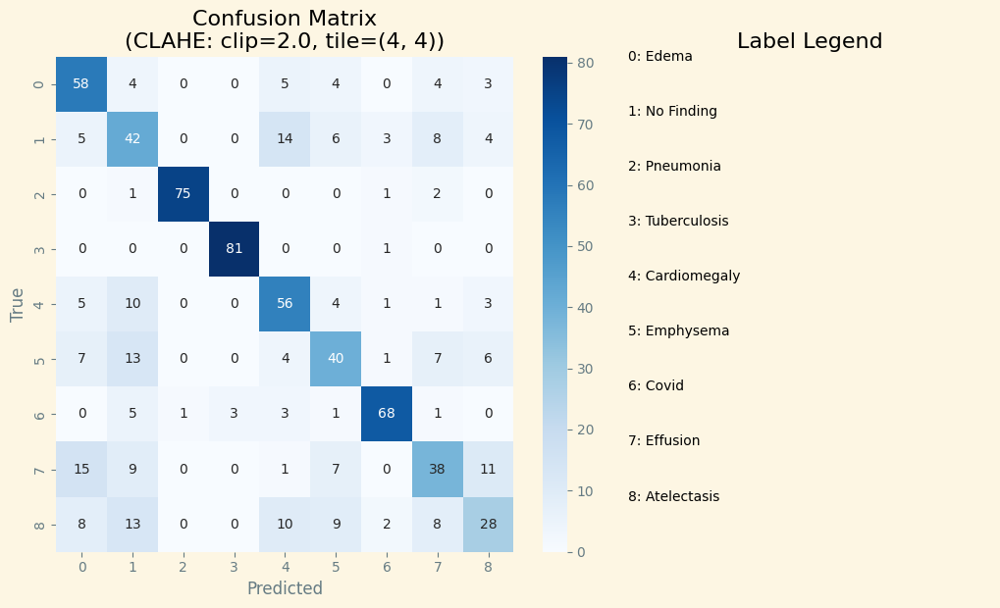

Overall performance for CLAHE settings: clip_2.0_tile_4x4
F1 Score: 0.6710


Training with CLAHE settings: clip_2.0_tile_8x8
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 120s 488ms/step - accuracy: 0.3431 - f1_score: 0.2000 - loss: 2.1600 - val_accuracy: 0.4222 - val_f1_score: 0.2664 - val_loss: 1.9602 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 86s 461ms/step - accuracy: 0.4893 - f1_score: 0.2805 - loss: 1.7431 - val_accuracy: 0.4556 - val_f1_score: 0.3052 - val_loss: 1.8756 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 86s 464ms/step - accuracy: 0.5228 - f1_score: 0.3124 - loss: 1.6868 - val_accuracy: 0.4944 - val_f1_score: 0.3379 - val_loss: 1.7793 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy: 0.5505 - f1_score: 0.3357 - loss: 1.6520
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


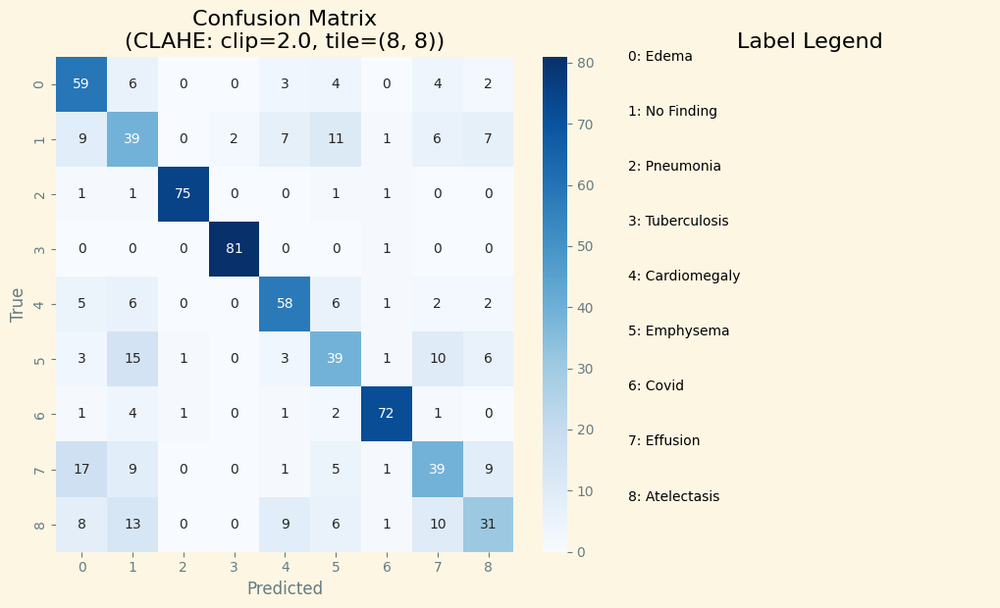

Overall performance for CLAHE settings: clip_2.0_tile_8x8
F1 Score: 0.6815


Training with CLAHE settings: clip_2.0_tile_16x16
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 126s 506ms/step - accuracy: 0.3151 - f1_score: 0.1866 - loss: 2.2020 - val_accuracy: 0.3750 - val_f1_score: 0.2484 - val_loss: 2.1741 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - accuracy: 0.4626 - f1_score: 0.2782 - loss: 1.7778
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.4627 - f1_score: 0.2782 - loss: 1.7777 - val_accuracy: 0.2389 - val_f1_score: 0.1569 - val_loss: 2.2584 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.5471 - f1_score: 0.3258 - loss: 1.6257 - val_accuracy: 0.5778 - val_f1_score: 0.4439 - val_loss: 1.5643 - learning_rate: 1.0000e-04
Epoch

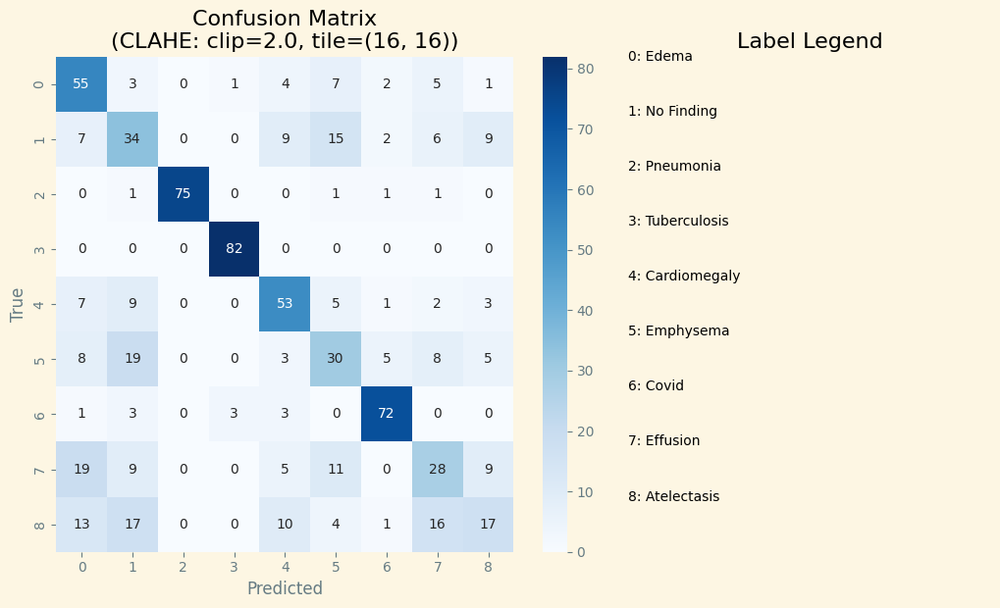

Overall performance for CLAHE settings: clip_2.0_tile_16x16
F1 Score: 0.6087


Training with CLAHE settings: clip_2.0_tile_32x32
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 119s 489ms/step - accuracy: 0.3467 - f1_score: 0.2034 - loss: 2.1771 - val_accuracy: 0.3556 - val_f1_score: 0.2490 - val_loss: 2.2944 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - accuracy: 0.4854 - f1_score: 0.2849 - loss: 1.7389
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 467ms/step - accuracy: 0.4853 - f1_score: 0.2849 - loss: 1.7389 - val_accuracy: 0.2917 - val_f1_score: 0.2054 - val_loss: 2.2715 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 472ms/step - accuracy: 0.5354 - f1_score: 0.3235 - loss: 1.6407 - val_accuracy: 0.6083 - val_f1_score: 0.4503 - val_loss: 1.5427 - learning_rate: 1.0000e-04
Epo

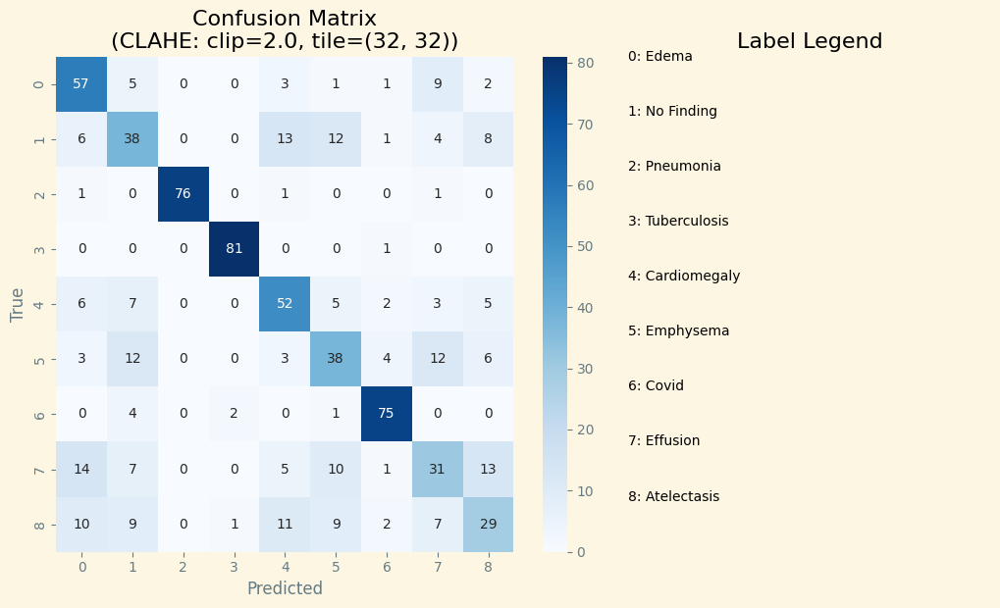

Overall performance for CLAHE settings: clip_2.0_tile_32x32
F1 Score: 0.6558


Training with CLAHE settings: clip_2.5_tile_4x4
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 494ms/step - accuracy: 0.3344 - f1_score: 0.2022 - loss: 2.1902 - val_accuracy: 0.1667 - val_f1_score: 0.0771 - val_loss: 2.6338 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 477ms/step - accuracy: 0.4672 - f1_score: 0.2851 - loss: 1.7721 - val_accuracy: 0.3889 - val_f1_score: 0.2662 - val_loss: 2.0108 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 472ms/step - accuracy: 0.5247 - f1_score: 0.3080 - loss: 1.7025 - val_accuracy: 0.4833 - val_f1_score: 0.3680 - val_loss: 1.7735 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.5816 - f1_score: 0.3579 - loss: 1.6136
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513

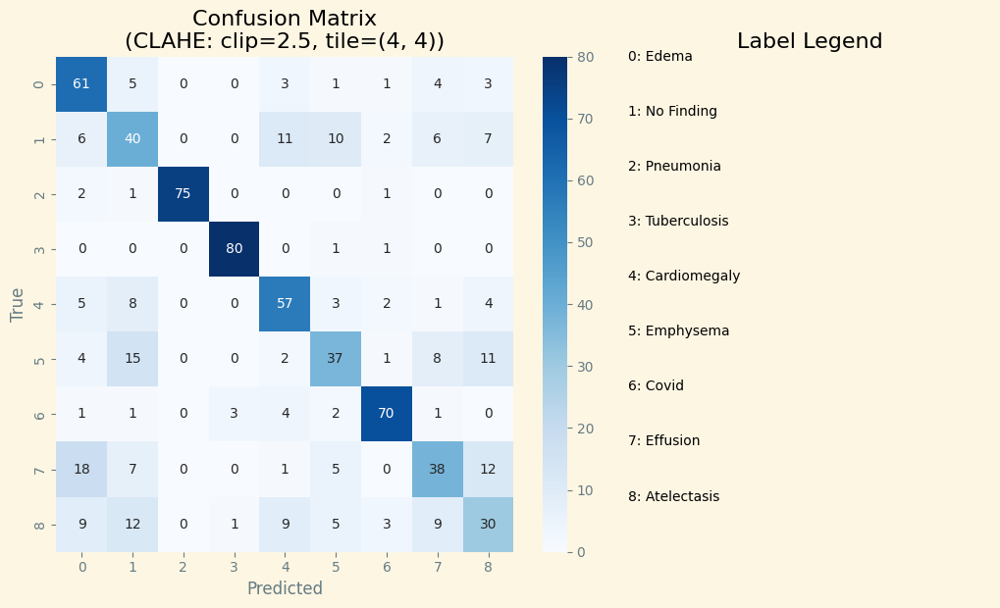

Overall performance for CLAHE settings: clip_2.5_tile_4x4
F1 Score: 0.6732


Training with CLAHE settings: clip_2.5_tile_8x8
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 118s 484ms/step - accuracy: 0.3633 - f1_score: 0.2172 - loss: 2.1532 - val_accuracy: 0.4389 - val_f1_score: 0.2686 - val_loss: 2.1590 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - accuracy: 0.4745 - f1_score: 0.2765 - loss: 1.7713
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 86s 466ms/step - accuracy: 0.4745 - f1_score: 0.2766 - loss: 1.7712 - val_accuracy: 0.3556 - val_f1_score: 0.2287 - val_loss: 2.2034 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 86s 464ms/step - accuracy: 0.5649 - f1_score: 0.3474 - loss: 1.6025 - val_accuracy: 0.6361 - val_f1_score: 0.4825 - val_loss: 1.4920 - learning_rate: 1.0000e-04
Epoch 4

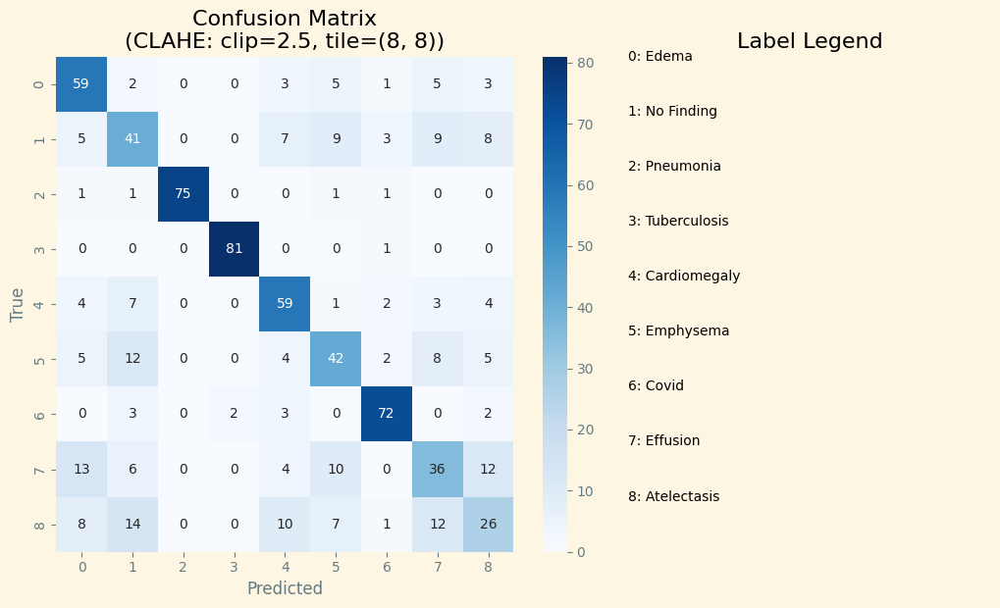

Overall performance for CLAHE settings: clip_2.5_tile_8x8
F1 Score: 0.6762


Training with CLAHE settings: clip_2.5_tile_16x16
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 124s 498ms/step - accuracy: 0.3400 - f1_score: 0.1960 - loss: 2.2032 - val_accuracy: 0.2417 - val_f1_score: 0.1259 - val_loss: 4.0798 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 475ms/step - accuracy: 0.4677 - f1_score: 0.2757 - loss: 1.7642 - val_accuracy: 0.4056 - val_f1_score: 0.2908 - val_loss: 1.8919 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step - accuracy: 0.5191 - f1_score: 0.3096 - loss: 1.6832
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 477ms/step - accuracy: 0.5191 - f1_score: 0.3096 - loss: 1.6833 - val_accuracy: 0.4417 - val_f1_score: 0.2927 - val_loss: 2.0554 - learning_rate: 0.0010
Epoch 4/1

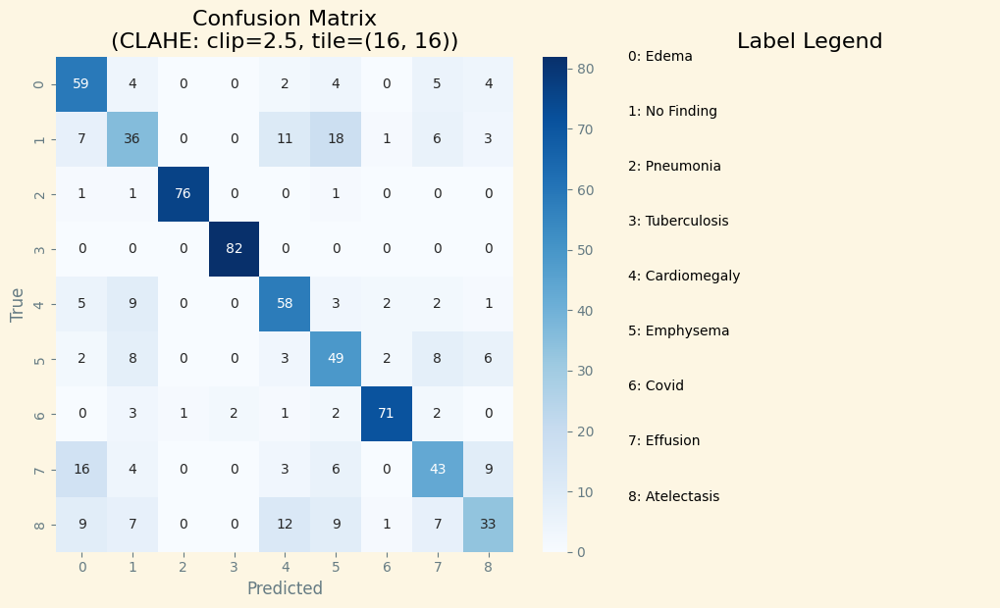

Overall performance for CLAHE settings: clip_2.5_tile_16x16
F1 Score: 0.6999


Training with CLAHE settings: clip_2.5_tile_32x32
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 120s 491ms/step - accuracy: 0.3293 - f1_score: 0.1906 - loss: 2.1845 - val_accuracy: 0.3639 - val_f1_score: 0.2454 - val_loss: 2.8862 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 473ms/step - accuracy: 0.4536 - f1_score: 0.2732 - loss: 1.7739 - val_accuracy: 0.3778 - val_f1_score: 0.2616 - val_loss: 2.1764 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 469ms/step - accuracy: 0.5222 - f1_score: 0.3075 - loss: 1.6831 - val_accuracy: 0.4444 - val_f1_score: 0.2777 - val_loss: 2.2146 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step - accuracy: 0.5344 - f1_score: 0.3339 - loss: 1.6543
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.000100000004749745

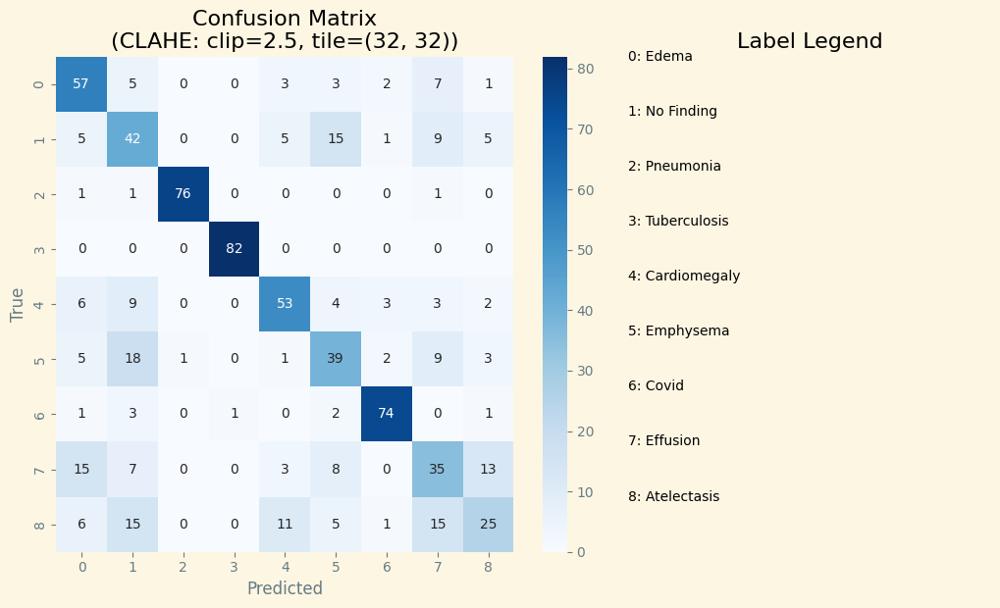

Overall performance for CLAHE settings: clip_2.5_tile_32x32
F1 Score: 0.6662


Training with CLAHE settings: clip_3.0_tile_4x4
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 121s 497ms/step - accuracy: 0.3454 - f1_score: 0.1959 - loss: 2.2003 - val_accuracy: 0.3972 - val_f1_score: 0.2539 - val_loss: 2.1245 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.4685 - f1_score: 0.2901 - loss: 1.7515 - val_accuracy: 0.4083 - val_f1_score: 0.2951 - val_loss: 2.1579 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.5143 - f1_score: 0.3100 - loss: 1.6826
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 473ms/step - accuracy: 0.5142 - f1_score: 0.3100 - loss: 1.6827 - val_accuracy: 0.3972 - val_f1_score: 0.2555 - val_loss: 2.0879 - learning_rate: 0.0010
Epoch 4/1

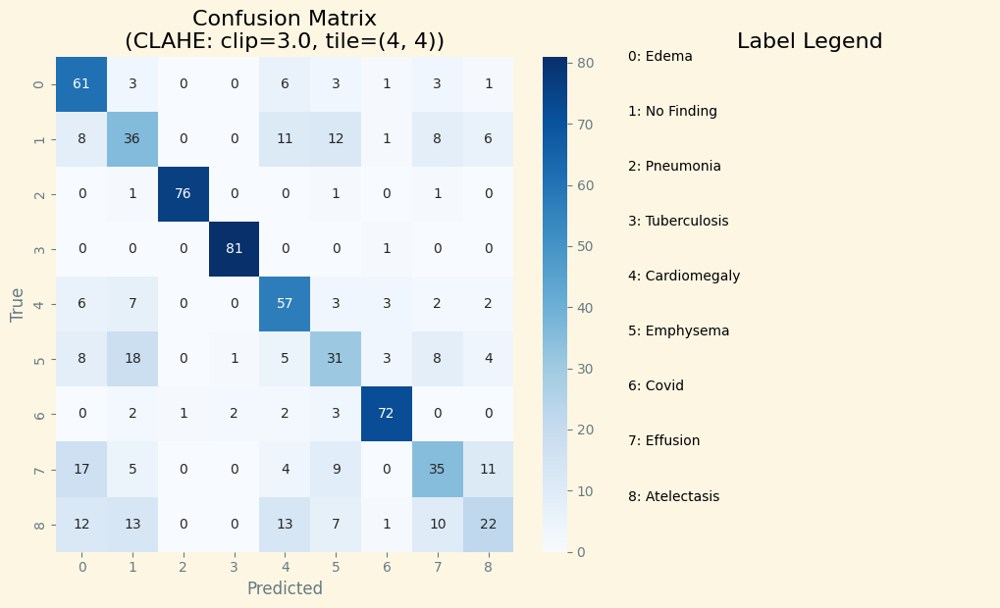

Overall performance for CLAHE settings: clip_3.0_tile_4x4
F1 Score: 0.6435


Training with CLAHE settings: clip_3.0_tile_8x8
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 120s 490ms/step - accuracy: 0.3480 - f1_score: 0.2015 - loss: 2.1869 - val_accuracy: 0.4167 - val_f1_score: 0.2943 - val_loss: 2.1719 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 471ms/step - accuracy: 0.4738 - f1_score: 0.2887 - loss: 1.7456 - val_accuracy: 0.5139 - val_f1_score: 0.3659 - val_loss: 1.7632 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.5274 - f1_score: 0.3193 - loss: 1.6641
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 469ms/step - accuracy: 0.5275 - f1_score: 0.3193 - loss: 1.6642 - val_accuracy: 0.4500 - val_f1_score: 0.2806 - val_loss: 1.8949 - learning_rate: 0.0010
Epoch 4/10


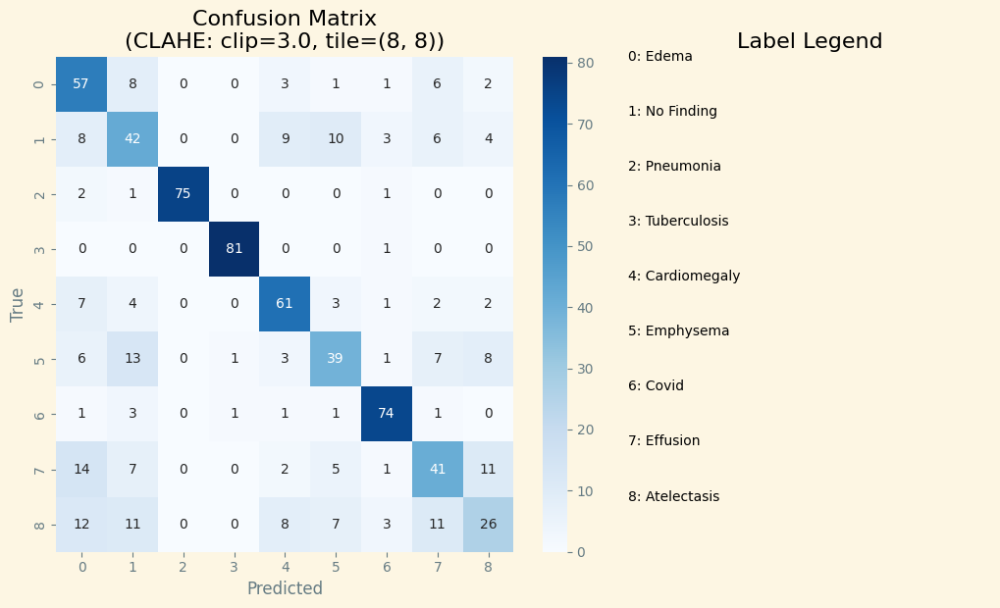

Overall performance for CLAHE settings: clip_3.0_tile_8x8
F1 Score: 0.6825


Training with CLAHE settings: clip_3.0_tile_16x16
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 121s 496ms/step - accuracy: 0.3476 - f1_score: 0.1968 - loss: 2.1845 - val_accuracy: 0.3139 - val_f1_score: 0.2290 - val_loss: 2.8825 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.4801 - f1_score: 0.2840 - loss: 1.7395
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 472ms/step - accuracy: 0.4801 - f1_score: 0.2841 - loss: 1.7396 - val_accuracy: 0.2806 - val_f1_score: 0.1650 - val_loss: 2.5074 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 471ms/step - accuracy: 0.5555 - f1_score: 0.3393 - loss: 1.6363 - val_accuracy: 0.5806 - val_f1_score: 0.4365 - val_loss: 1.5516 - learning_rate: 1.0000e-04
Epoch

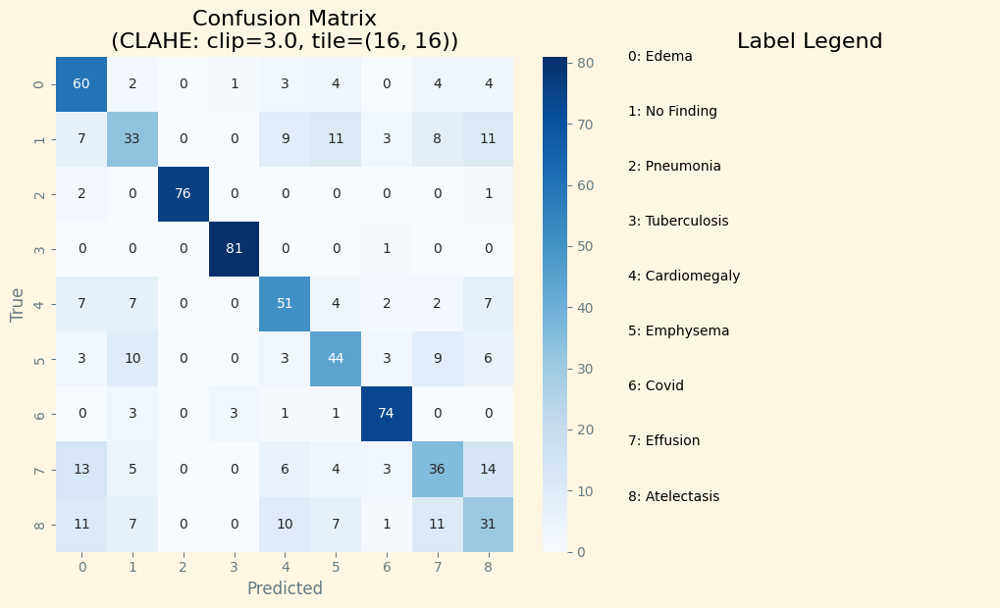

Overall performance for CLAHE settings: clip_3.0_tile_16x16
F1 Score: 0.6687


Training with CLAHE settings: clip_3.0_tile_32x32
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 121s 497ms/step - accuracy: 0.3488 - f1_score: 0.2041 - loss: 2.1989 - val_accuracy: 0.3861 - val_f1_score: 0.2454 - val_loss: 2.1444 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 475ms/step - accuracy: 0.4902 - f1_score: 0.2933 - loss: 1.7402 - val_accuracy: 0.4222 - val_f1_score: 0.2863 - val_loss: 1.9367 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.4987 - f1_score: 0.2983 - loss: 1.6889
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 473ms/step - accuracy: 0.4989 - f1_score: 0.2984 - loss: 1.6888 - val_accuracy: 0.3444 - val_f1_score: 0.1976 - val_loss: 2.0067 - learning_rate: 0.0010
Epoch 4

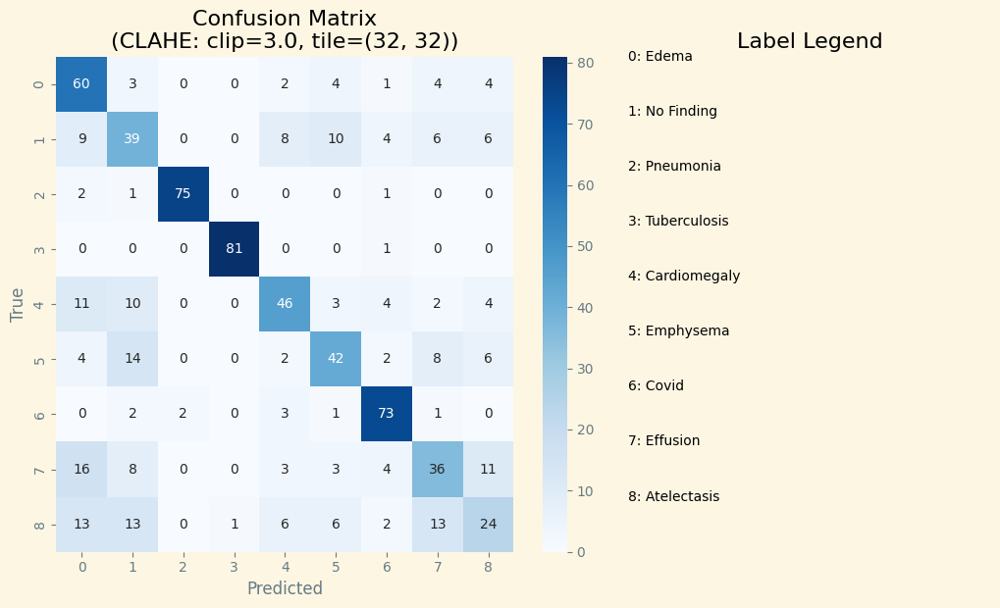

Overall performance for CLAHE settings: clip_3.0_tile_32x32
F1 Score: 0.6540


Training with CLAHE settings: clip_3.5_tile_4x4
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 121s 492ms/step - accuracy: 0.3400 - f1_score: 0.1952 - loss: 2.1776 - val_accuracy: 0.3528 - val_f1_score: 0.2186 - val_loss: 2.4172 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 469ms/step - accuracy: 0.4629 - f1_score: 0.2858 - loss: 1.7429 - val_accuracy: 0.4639 - val_f1_score: 0.3208 - val_loss: 1.7714 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 472ms/step - accuracy: 0.5193 - f1_score: 0.3091 - loss: 1.6950 - val_accuracy: 0.4778 - val_f1_score: 0.3366 - val_loss: 1.7664 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 467ms/step - accuracy: 0.5614 - f1_score: 0.3406 - loss: 1.6345 - val_accuracy: 0.4917 - val_f1_score: 0.3575 - val_loss: 1.8497 - learnin

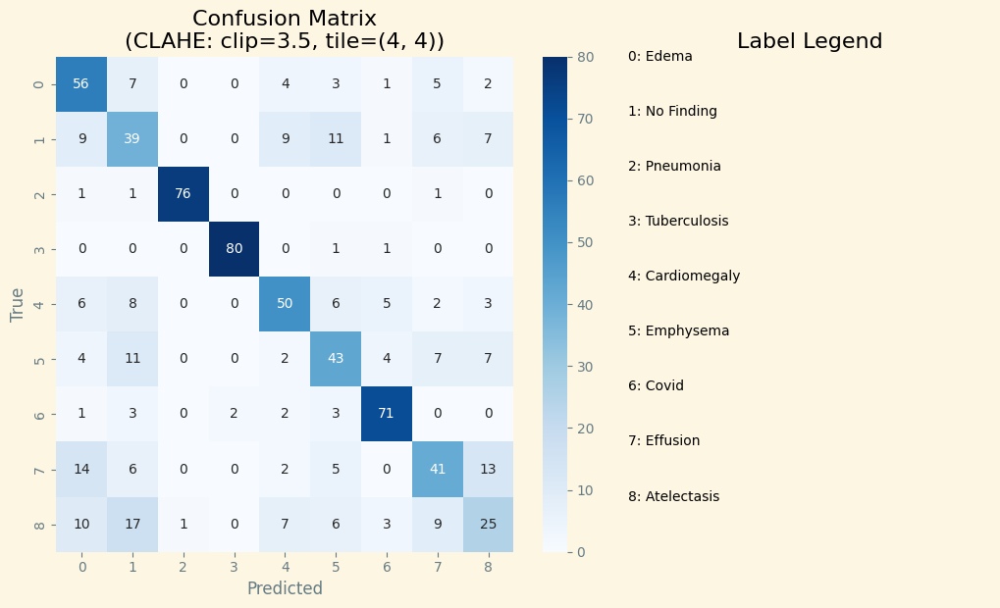

Overall performance for CLAHE settings: clip_3.5_tile_4x4
F1 Score: 0.6635


Training with CLAHE settings: clip_3.5_tile_8x8
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 121s 495ms/step - accuracy: 0.3409 - f1_score: 0.1924 - loss: 2.1861 - val_accuracy: 0.4528 - val_f1_score: 0.3312 - val_loss: 2.0003 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 471ms/step - accuracy: 0.4570 - f1_score: 0.2760 - loss: 1.7720 - val_accuracy: 0.4972 - val_f1_score: 0.3470 - val_loss: 1.7975 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.5156 - f1_score: 0.3094 - loss: 1.7036
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 470ms/step - accuracy: 0.5156 - f1_score: 0.3094 - loss: 1.7037 - val_accuracy: 0.3472 - val_f1_score: 0.2201 - val_loss: 1.9890 - learning_rate: 0.0010
Epoch 4/10


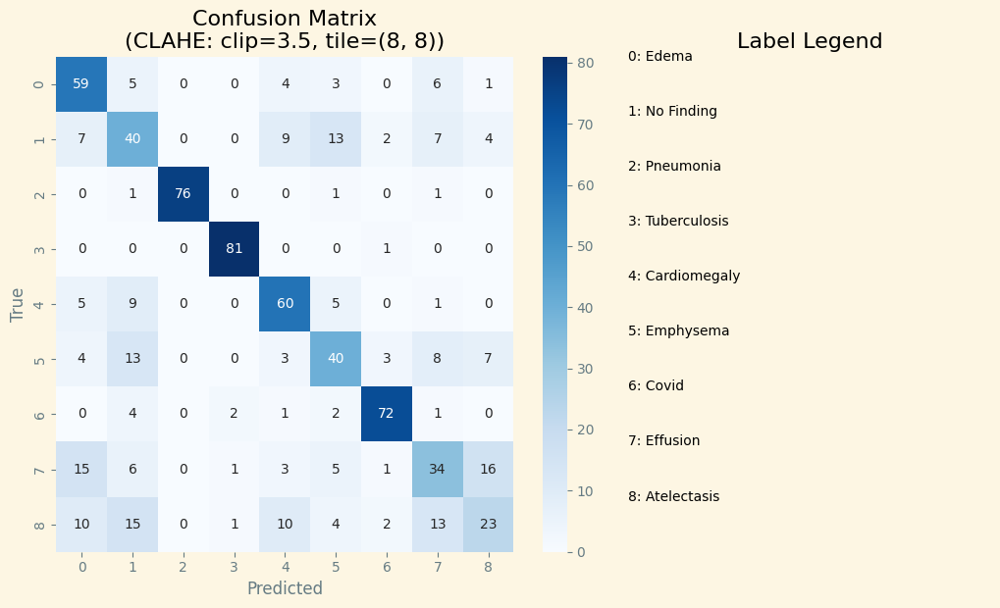

Overall performance for CLAHE settings: clip_3.5_tile_8x8
F1 Score: 0.6660


Training with CLAHE settings: clip_3.5_tile_16x16
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 123s 498ms/step - accuracy: 0.3314 - f1_score: 0.1914 - loss: 2.2059 - val_accuracy: 0.3833 - val_f1_score: 0.2336 - val_loss: 3.1342 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 471ms/step - accuracy: 0.4805 - f1_score: 0.2852 - loss: 1.7603 - val_accuracy: 0.4417 - val_f1_score: 0.3090 - val_loss: 1.8922 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step - accuracy: 0.5320 - f1_score: 0.3177 - loss: 1.6818
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 470ms/step - accuracy: 0.5320 - f1_score: 0.3177 - loss: 1.6817 - val_accuracy: 0.3528 - val_f1_score: 0.2343 - val_loss: 2.3487 - learning_rate: 0.0010
Epoch 4/1

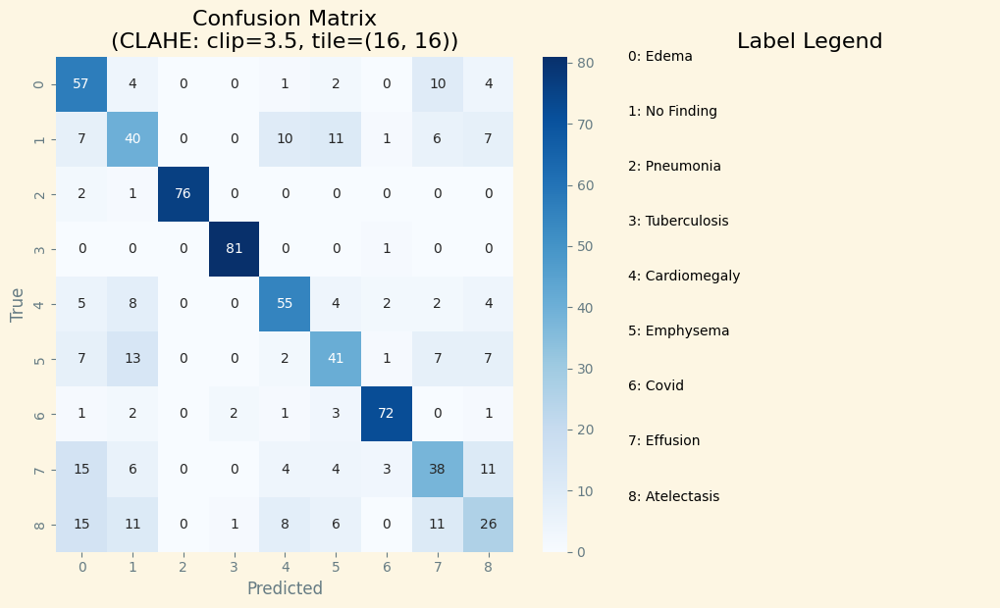

Overall performance for CLAHE settings: clip_3.5_tile_16x16
F1 Score: 0.6705


Training with CLAHE settings: clip_3.5_tile_32x32
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 125s 513ms/step - accuracy: 0.3086 - f1_score: 0.1805 - loss: 2.2341 - val_accuracy: 0.2722 - val_f1_score: 0.1636 - val_loss: 2.8899 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 481ms/step - accuracy: 0.4661 - f1_score: 0.2641 - loss: 1.7735 - val_accuracy: 0.3944 - val_f1_score: 0.2457 - val_loss: 1.8183 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 482ms/step - accuracy: 0.5079 - f1_score: 0.3022 - loss: 1.6995 - val_accuracy: 0.4667 - val_f1_score: 0.3077 - val_loss: 1.7783 - learning_rate: 0.0010
Epoch 4/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step - accuracy: 0.5607 - f1_score: 0.3417 - loss: 1.6310
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.000100000004749745

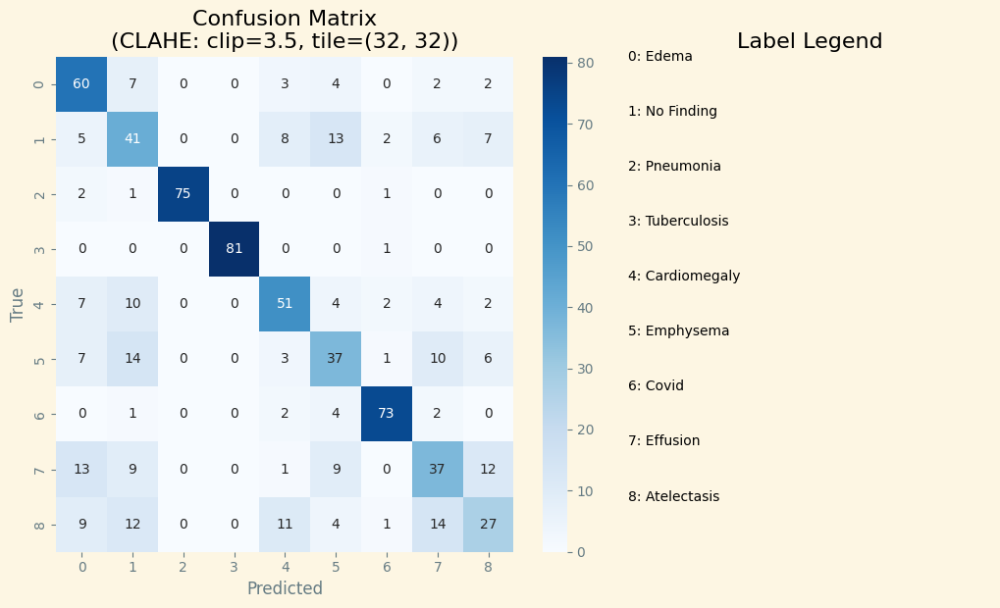

Overall performance for CLAHE settings: clip_3.5_tile_32x32
F1 Score: 0.6658


Training with CLAHE settings: clip_4.0_tile_4x4
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 122s 496ms/step - accuracy: 0.3260 - f1_score: 0.1934 - loss: 2.1924 - val_accuracy: 0.4167 - val_f1_score: 0.2607 - val_loss: 2.0856 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - accuracy: 0.4689 - f1_score: 0.2815 - loss: 1.7538
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 477ms/step - accuracy: 0.4691 - f1_score: 0.2816 - loss: 1.7536 - val_accuracy: 0.2333 - val_f1_score: 0.0966 - val_loss: 3.3825 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 475ms/step - accuracy: 0.5829 - f1_score: 0.3642 - loss: 1.6051 - val_accuracy: 0.6306 - val_f1_score: 0.5085 - val_loss: 1.5403 - learning_rate: 1.0000e-04
Epoch

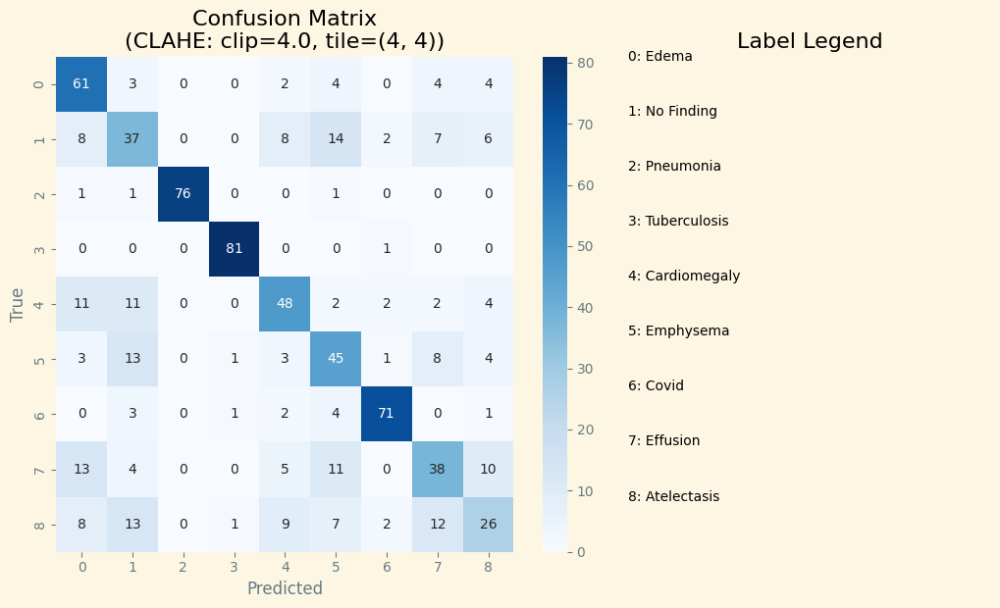

Overall performance for CLAHE settings: clip_4.0_tile_4x4
F1 Score: 0.6659


Training with CLAHE settings: clip_4.0_tile_8x8
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 122s 495ms/step - accuracy: 0.3476 - f1_score: 0.1989 - loss: 2.1320 - val_accuracy: 0.2722 - val_f1_score: 0.1550 - val_loss: 2.8402 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.4841 - f1_score: 0.2931 - loss: 1.7373
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 88s 477ms/step - accuracy: 0.4841 - f1_score: 0.2930 - loss: 1.7374 - val_accuracy: 0.2389 - val_f1_score: 0.1277 - val_loss: 2.7709 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.5742 - f1_score: 0.3542 - loss: 1.5935 - val_accuracy: 0.5944 - val_f1_score: 0.4611 - val_loss: 1.5358 - learning_rate: 1.0000e-04
Epoch 4

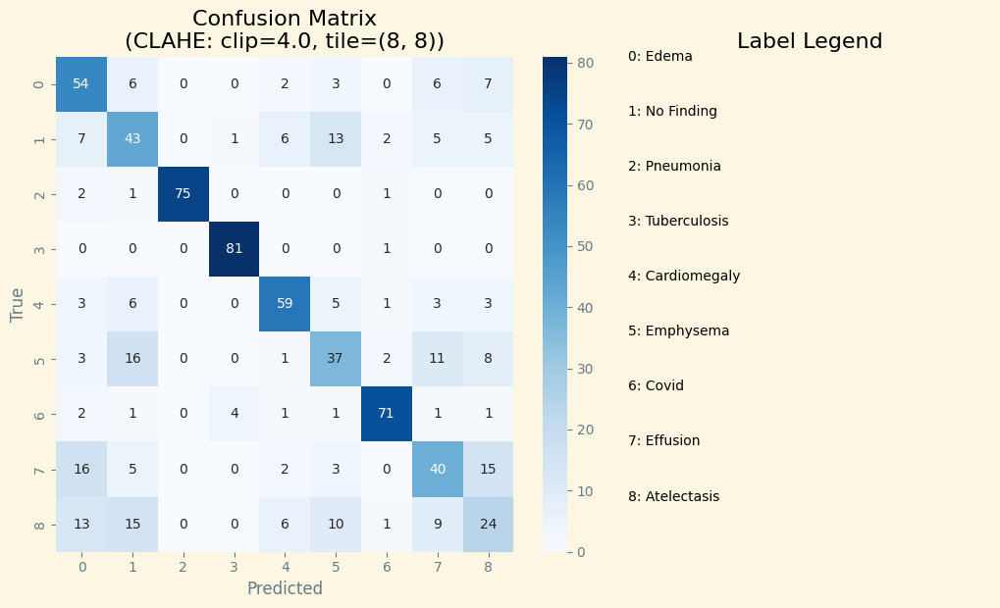

Overall performance for CLAHE settings: clip_4.0_tile_8x8
F1 Score: 0.6685


Training with CLAHE settings: clip_4.0_tile_16x16
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 122s 502ms/step - accuracy: 0.3607 - f1_score: 0.2149 - loss: 2.1195 - val_accuracy: 0.4222 - val_f1_score: 0.2861 - val_loss: 2.6752 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.4737 - f1_score: 0.2806 - loss: 1.7658
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 477ms/step - accuracy: 0.4738 - f1_score: 0.2806 - loss: 1.7656 - val_accuracy: 0.4222 - val_f1_score: 0.2916 - val_loss: 1.9088 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 87s 470ms/step - accuracy: 0.5379 - f1_score: 0.3301 - loss: 1.6488 - val_accuracy: 0.6028 - val_f1_score: 0.4695 - val_loss: 1.5281 - learning_rate: 1.0000e-04
Epoch

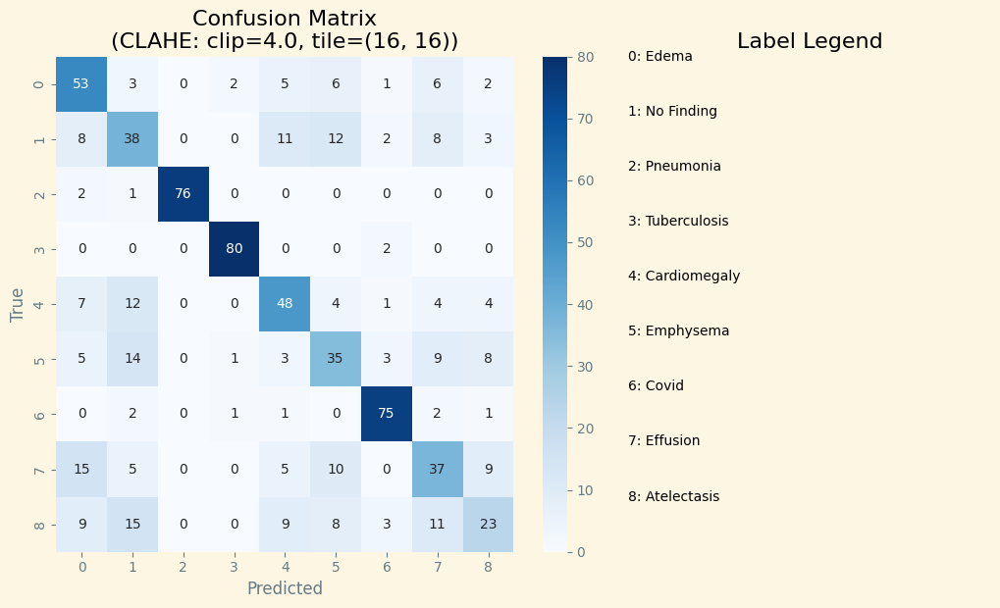

Overall performance for CLAHE settings: clip_4.0_tile_16x16
F1 Score: 0.6390


Training with CLAHE settings: clip_4.0_tile_32x32
#########################
### Fold 1
### train size 2880, valid size 720
#########################
Epoch 1/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 122s 501ms/step - accuracy: 0.3498 - f1_score: 0.2015 - loss: 2.2091 - val_accuracy: 0.2222 - val_f1_score: 0.1203 - val_loss: 2.5554 - learning_rate: 0.0010
Epoch 2/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - accuracy: 0.4514 - f1_score: 0.2685 - loss: 1.7892
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
180/180 ━━━━━━━━━━━━━━━━━━━━ 89s 480ms/step - accuracy: 0.4514 - f1_score: 0.2685 - loss: 1.7891 - val_accuracy: 0.1306 - val_f1_score: 0.0505 - val_loss: 3.2736 - learning_rate: 0.0010
Epoch 3/10
180/180 ━━━━━━━━━━━━━━━━━━━━ 91s 488ms/step - accuracy: 0.5384 - f1_score: 0.3394 - loss: 1.6505 - val_accuracy: 0.5972 - val_f1_score: 0.4549 - val_loss: 1.5354 - learning_rate: 1.0000e-04
Epo

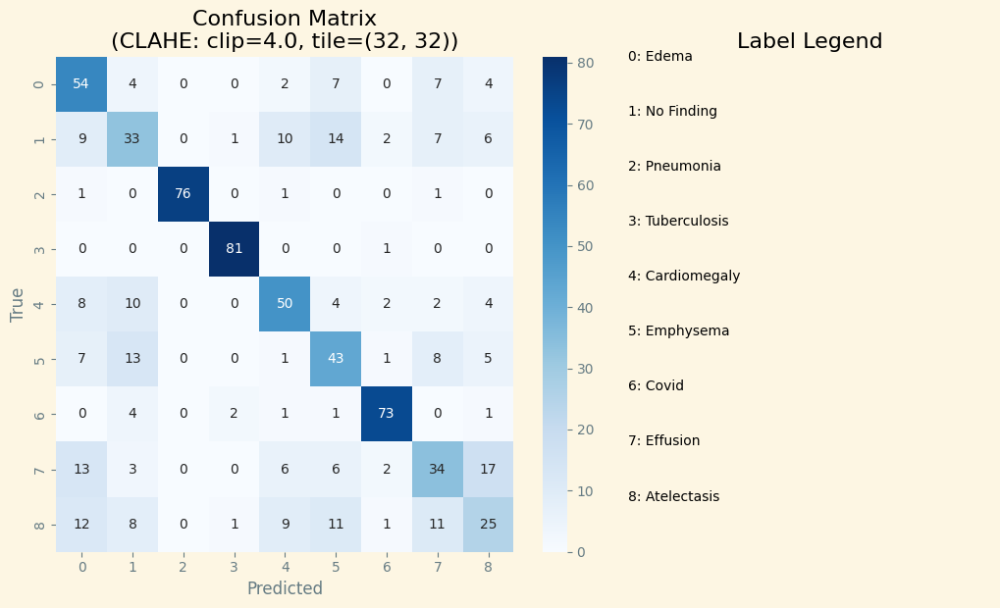

Overall performance for CLAHE settings: clip_4.0_tile_32x32
F1 Score: 0.6457


Final Results:
CLAHE setting: clip_2.0_tile_4x4
F1 Score: 0.6710
---
CLAHE setting: clip_2.0_tile_8x8
F1 Score: 0.6815
---
CLAHE setting: clip_2.0_tile_16x16
F1 Score: 0.6087
---
CLAHE setting: clip_2.0_tile_32x32
F1 Score: 0.6558
---
CLAHE setting: clip_2.5_tile_4x4
F1 Score: 0.6732
---
CLAHE setting: clip_2.5_tile_8x8
F1 Score: 0.6762
---
CLAHE setting: clip_2.5_tile_16x16
F1 Score: 0.6999
---
CLAHE setting: clip_2.5_tile_32x32
F1 Score: 0.6662
---
CLAHE setting: clip_3.0_tile_4x4
F1 Score: 0.6435
---
CLAHE setting: clip_3.0_tile_8x8
F1 Score: 0.6825
---
CLAHE setting: clip_3.0_tile_16x16
F1 Score: 0.6687
---
CLAHE setting: clip_3.0_tile_32x32
F1 Score: 0.6540
---
CLAHE setting: clip_3.5_tile_4x4
F1 Score: 0.6635
---
CLAHE setting: clip_3.5_tile_8x8
F1 Score: 0.6660
---
CLAHE setting: clip_3.5_tile_16x16
F1 Score: 0.6705
---
CLAHE setting: clip_3.5_tile_32x32
F1 Score: 0.6658
---
CLAHE setting: clip_4.0_ti

In [26]:
import tensorflow.keras.backend as K
from collections import defaultdict
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import gc

# CLAHE 설정 리스트 정의
clahe_settings = [
    {"clip_limit": 2.0, "tile_grid_size": (4,4)},
    {"clip_limit": 2.0, "tile_grid_size": (8,8)},
    {"clip_limit": 2.0, "tile_grid_size": (16,16)},
    {"clip_limit": 2.0, "tile_grid_size": (32,32)},

    {"clip_limit": 2.5, "tile_grid_size": (4,4)},
    {"clip_limit": 2.5, "tile_grid_size": (8,8)},
    {"clip_limit": 2.5, "tile_grid_size": (16,16)},
    {"clip_limit": 2.5, "tile_grid_size": (32,32)},
    
    {"clip_limit": 3.0, "tile_grid_size": (4,4)},
    {"clip_limit": 3.0, "tile_grid_size": (8,8)},
    {"clip_limit": 3.0, "tile_grid_size": (16,16)},
    {"clip_limit": 3.0, "tile_grid_size": (32,32)},

    {"clip_limit": 3.5, "tile_grid_size": (4,4)},
    {"clip_limit": 3.5, "tile_grid_size": (8,8)},
    {"clip_limit": 3.5, "tile_grid_size": (16,16)},
    {"clip_limit": 3.5, "tile_grid_size": (32,32)},
    
    {"clip_limit": 4.0, "tile_grid_size": (4,4)},
    {"clip_limit": 4.0, "tile_grid_size": (8,8)},
    {"clip_limit": 4.0, "tile_grid_size": (16,16)},
    {"clip_limit": 4.0, "tile_grid_size": (32,32)},
    ]

# 결과를 저장할 딕셔너리
results = {}

for clahe_setting in clahe_settings:
    setting_key = f"clip_{clahe_setting['clip_limit']}_tile_{clahe_setting['tile_grid_size'][0]}x{clahe_setting['tile_grid_size'][1]}"
    print(f"Training with CLAHE settings: {setting_key}")
    
    all_oof = []
    all_true = []
    all_index = []
    all_history = defaultdict(list)

    for i in range(1):  # 필요하다면 이 범위를 조정하세요
        print('#'*25)
        print(f'### Fold {i+1}')
        
        train_gen = DataGenerator(df_train[df_train['Fold'] != i], shuffle=True, augment1=True, augment2=False, 
                                  batch_size=16, preprocess=preprocess_input, 
                                  clahe_clip_limit=clahe_setting['clip_limit'], 
                                  clahe_tile_grid_size=clahe_setting['tile_grid_size'])
        valid_gen = DataGenerator(df_train[df_train['Fold'] == i], shuffle=False, batch_size=32, 
                                  preprocess=preprocess_input,
                                  clahe_clip_limit=clahe_setting['clip_limit'], 
                                  clahe_tile_grid_size=clahe_setting['tile_grid_size'])
        
        print(f'### train size {len(df_train[df_train["Fold"] != i])}, valid size {len(df_train[df_train["Fold"] == i])}')
        print('#'*25)
        
        K.clear_session()
        with strategy.scope():
            model = build_model()
        
        if LOAD_MODELS_FROM is None:
            history = model.fit(train_gen, verbose=1,
                  validation_data=valid_gen,
                  epochs=EPOCHS, callbacks=[lr])
            model.save_weights(f'ResNet_f{i}_{setting_key}.weights.h5')
            all_history['Train Loss'].append(history.history['loss'])
            all_history['Valid Loss'].append(history.history['val_loss'])
            all_history['Valid F1'].append(history.history['val_f1_score'])
            all_history['Train F1'].append(history.history['f1_score'])
            all_history['Valid Accuracy'].append(history.history['val_accuracy'])
            all_history['Train Accuracy'].append(history.history['accuracy'])
        else:
            model.load_weights(f'{LOAD_MODELS_FROM}ResNet_f{i}_{setting_key}.weights.h5')
        
        oof = model.predict(valid_gen, verbose=1)
        all_oof.append(oof)
        all_true.append(df_train[df_train['Fold'] == i][TARGET].values)
        all_index.append(df_train[df_train['Fold'] == i]['Image Index'].values)
        
        true_labels = np.argmax(df_train[df_train['Fold'] == i][TARGET].values, axis=1)
        pred_labels = np.argmax(oof, axis=1)
        create_confusion_matrix(true_labels,pred_labels,
                                TARGET,
                                clahe_setting['clip_limit'], clahe_setting['tile_grid_size'])
            
        
        del model, oof, train_gen, valid_gen
        gc.collect()
    
    all_oof = np.concatenate(all_oof)
    all_true = np.concatenate(all_true)
    all_index = np.concatenate(all_index)

    # 전체 성능 평가 (사용자 정의 f1_score 사용)
    overall_f1 = f1_score(all_true, all_oof)  # 사용자가 정의한 f1_score 함수 사용

    # 결과를 딕셔너리에 저장
    results[setting_key] = {
        'f1_score': overall_f1,
        'history': all_history,
        'oof_predictions': all_oof,
        'true_values': all_true,
        'image_indices': all_index
    }

    print(f"Overall performance for CLAHE settings: {setting_key}")
    print(f"F1 Score: {overall_f1:.4f}")
    print("\n")  # CLAHE 설정 간 구분을 위한 빈 줄

# 최종 결과 출력
print("Final Results:")
for setting, result in results.items():
    print(f"CLAHE setting: {setting}")
    print(f"F1 Score: {result['f1_score']:.4f}")
    print("---")

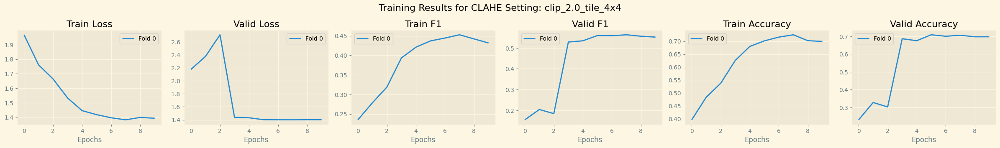

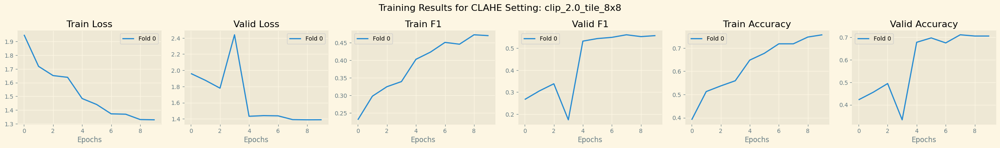

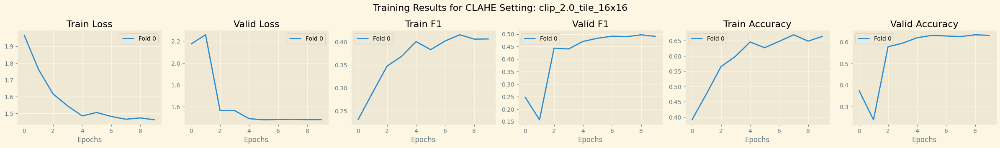

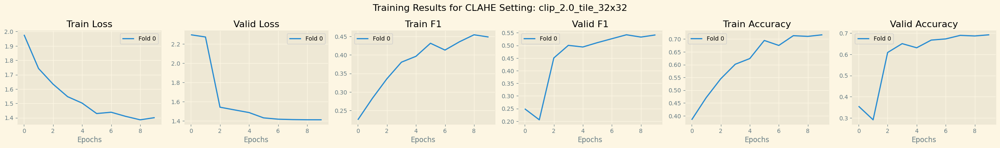

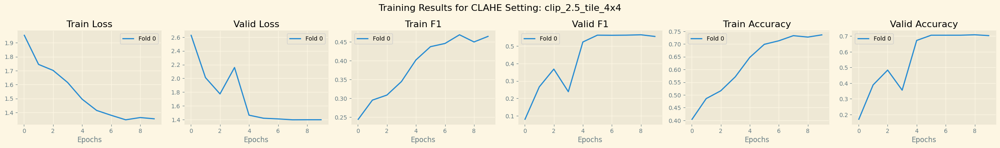

...

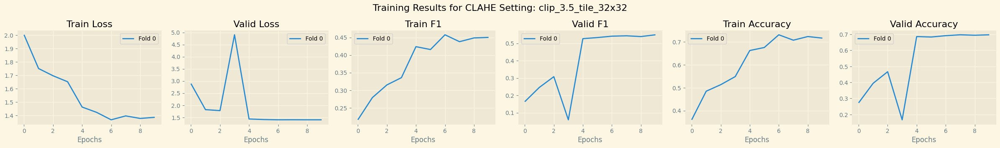

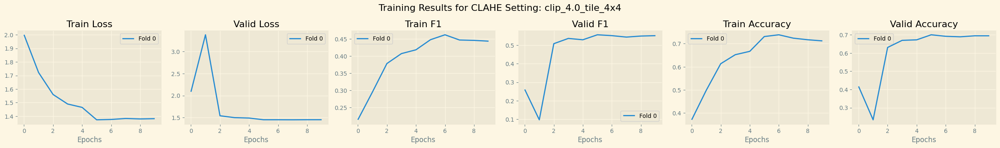

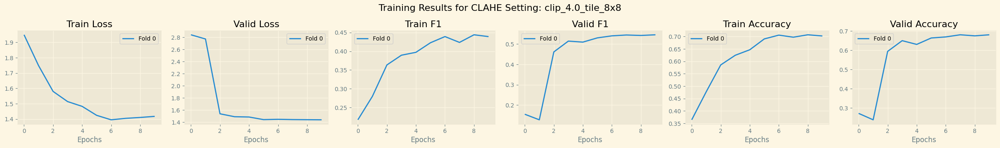

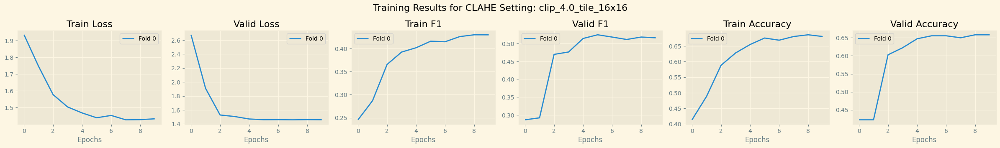

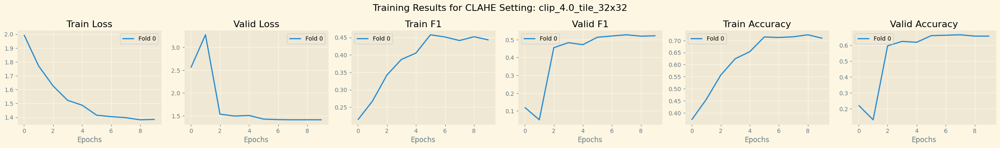

In [27]:
# 각 CLAHE 설정에 대한 그래프 생성
for setting_key, result in results.items():
    all_history = result['history']

    if len(all_history['Train Loss']) > 0:  # 훈련 데이터가 있는 경우에만 그래프 생성
        plt.figure(figsize=(24, 6))  # 전체 크기를 크게 설정하되, 높이를 줄임

        plt.suptitle(f'Training Results for CLAHE Setting: {setting_key}', fontsize=16)

        metrics = [
            ('Train Loss', 'Valid Loss'), 
            ('Train F1', 'Valid F1'), 
            ('Train Accuracy', 'Valid Accuracy')
        ]

        for idx, (train_metric, valid_metric) in enumerate(metrics):
            plt.subplot(2, 6, idx*2 + 1)  # 2행 6열의 서브플롯 구성
            plt.title(train_metric)
            for fold, values in enumerate(all_history[train_metric]):
                plt.plot(values, label=f'Fold {fold}')
            plt.xlabel('Epochs')
            plt.legend()

            plt.subplot(2, 6, idx*2 + 2)  # 같은 행에 있는 유효성 데이터 플롯
            plt.title(valid_metric)
            for fold, values in enumerate(all_history[valid_metric]):
                plt.plot(values, label=f'Fold {fold}')
            plt.xlabel('Epochs')
            plt.legend()

        plt.tight_layout()
        plt.show()
    else:
        print(f"No training data available for CLAHE setting: {setting_key}")

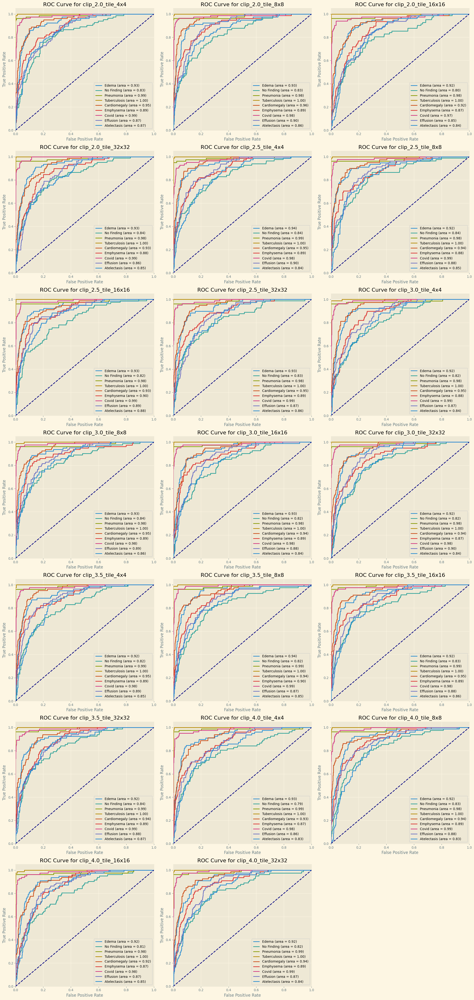

In [28]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# CLAHE 설정의 수에 따라 subplot 크기 조정
num_settings = len(results)
num_cols = 3  # 한 줄에 3개씩 배치
num_rows = (num_settings + num_cols - 1) // num_cols  # 행의 수 계산

fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 6 * num_rows))
axs = axs.flatten()  # 인덱싱을 쉽게 하기 위해 1D 배열로 변환

for idx, (setting_key, result) in enumerate(results.items()):
    all_true = result['true_values']
    all_oof = result['oof_predictions']
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    axs[idx].set_title(f'ROC Curve for {setting_key}')
    
    for i in range(len(TARGET)):
        fpr[i], tpr[i], _ = roc_curve(all_true[:, i], all_oof[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        axs[idx].plot(fpr[i], tpr[i], lw=2,
                      label=f'{TARGET[i]} (area = {roc_auc[i]:0.2f})')
    
    axs[idx].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axs[idx].set_xlim([0.0, 1.0])
    axs[idx].set_ylim([0.0, 1.05])
    axs[idx].set_xlabel('False Positive Rate')
    axs[idx].set_ylabel('True Positive Rate')
    axs[idx].legend(loc="lower right")

# 빈 플롯이 생길 수 있으므로 제거
for j in range(idx + 1, num_rows * num_cols):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

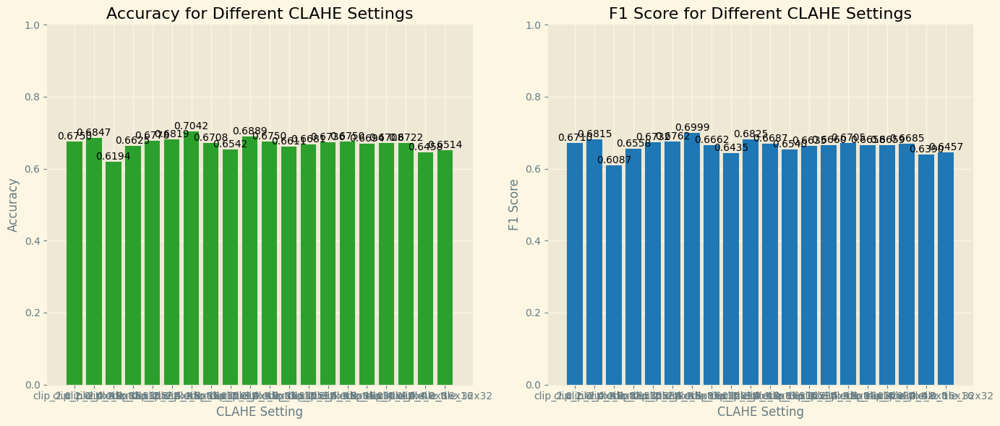

,CLAHE Setting,Accuracy,F1 Score
0,clip_2.0_tile_4x4,0.675000,0.671043
1,clip_2.0_tile_8x8,0.684722,0.681521
2,clip_2.0_tile_16x16,0.619444,0.608744
3,clip_2.0_tile_32x32,0.662500,0.655754
4,clip_2.5_tile_4x4,0.677778,0.673192
5,clip_2.5_tile_8x8,0.681944,0.676248
6,clip_2.5_tile_16x16,0.704167,0.699933
7,clip_2.5_tile_32x32,0.670833,0.666232
8,clip_3.0_tile_4x4,0.654167,0.643509
9,clip_3.0_tile_8x8,0.688889,0.682492


In [29]:
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score
import numpy as np

# 결과를 저장할 리스트
results_summary = []

# 각 CLAHE 설정에 대한 메트릭 계산
for setting_key, result in results.items():
    all_true = result['true_values']
    all_oof = result['oof_predictions']
    
    # Accuracy
    accuracy = accuracy_score(np.argmax(all_true, axis=1), np.argmax(all_oof, axis=1))
    
    # F1 Score
    f1 = f1_score(np.argmax(all_true, axis=1), np.argmax(all_oof, axis=1), average='macro')
    
    # 결과를 리스트에 저장
    results_summary.append({
        'CLAHE Setting': setting_key,
        'Accuracy': accuracy,
        'F1 Score': f1
    })

# 리스트를 데이터프레임으로 변환
results_df = pd.DataFrame(results_summary)

# 결과를 시각화 - 두 개의 별도 그래프 생성 (y축을 0~1로 설정)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Accuracy plot
ax1.set_title('Accuracy for Different CLAHE Settings')
ax1.bar(results_df['CLAHE Setting'], results_df['Accuracy'], color='tab:green')
ax1.set_xlabel('CLAHE Setting')
ax1.set_ylabel('Accuracy')
ax1.set_ylim(0, 1)  # y축 범위를 0에서 1로 설정
for i, v in enumerate(results_df['Accuracy']):
    ax1.text(i, v, f'{v:.4f}', ha='center', va='bottom')

# F1 Score plot
ax2.set_title('F1 Score for Different CLAHE Settings')
ax2.bar(results_df['CLAHE Setting'], results_df['F1 Score'], color='tab:blue')
ax2.set_xlabel('CLAHE Setting')
ax2.set_ylabel('F1 Score')
ax2.set_ylim(0, 1)  # y축 범위를 0에서 1로 설정
for i, v in enumerate(results_df['F1 Score']):
    ax2.text(i, v, f'{v:.4f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

results_df

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>5. Inference</b></div>

Testing with CLAHE settings: clip_2.0_tile_4x4
Fold 1
 1/15 ━━━━━━━━━━━━━━━━━━━━ 50s 4s/step

I0000 00:00:1724113135.503431      70 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


15/15 ━━━━━━━━━━━━━━━━━━━━ 31s 2s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_4x4 = 0.6311111111111111
F1 Score for Test Set with CLAHE settings clip_2.0_tile_4x4 = 0.6319562431006326


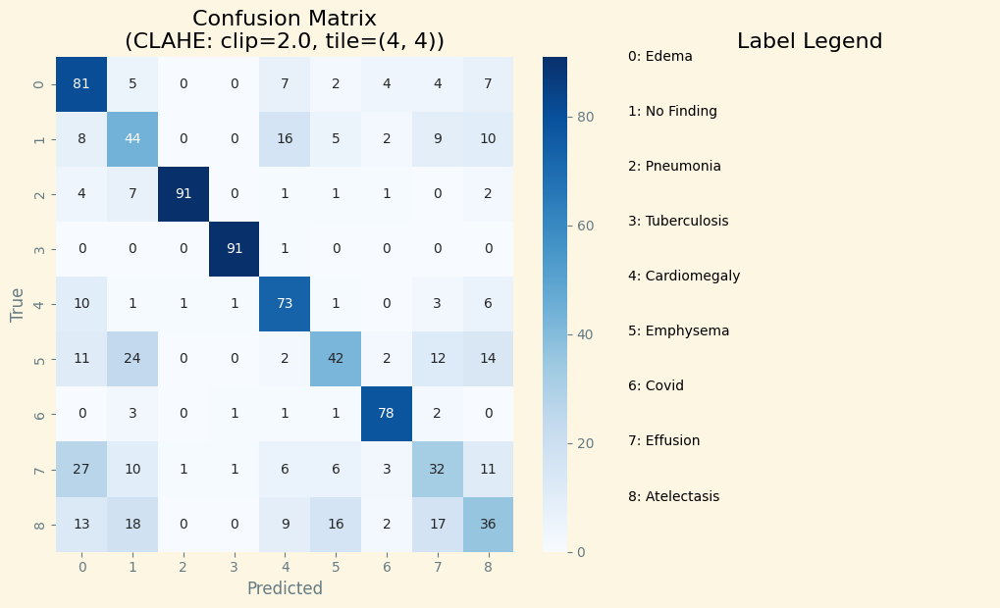

Testing with CLAHE settings: clip_2.0_tile_8x8
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_8x8 = 0.66
F1 Score for Test Set with CLAHE settings clip_2.0_tile_8x8 = 0.665806889478276


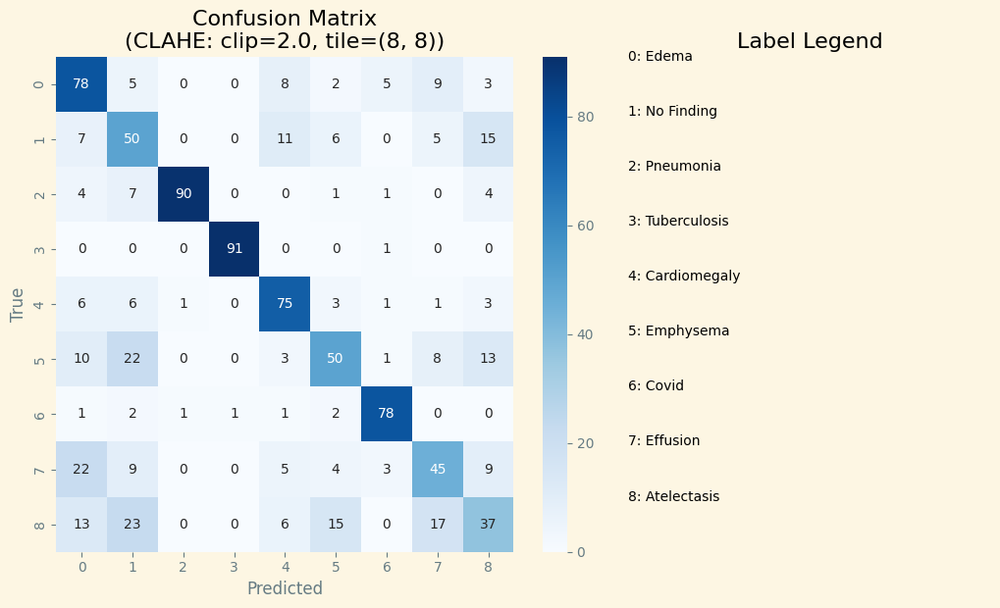

Testing with CLAHE settings: clip_2.0_tile_16x16
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_16x16 = 0.6066666666666667
F1 Score for Test Set with CLAHE settings clip_2.0_tile_16x16 = 0.6073143561458718


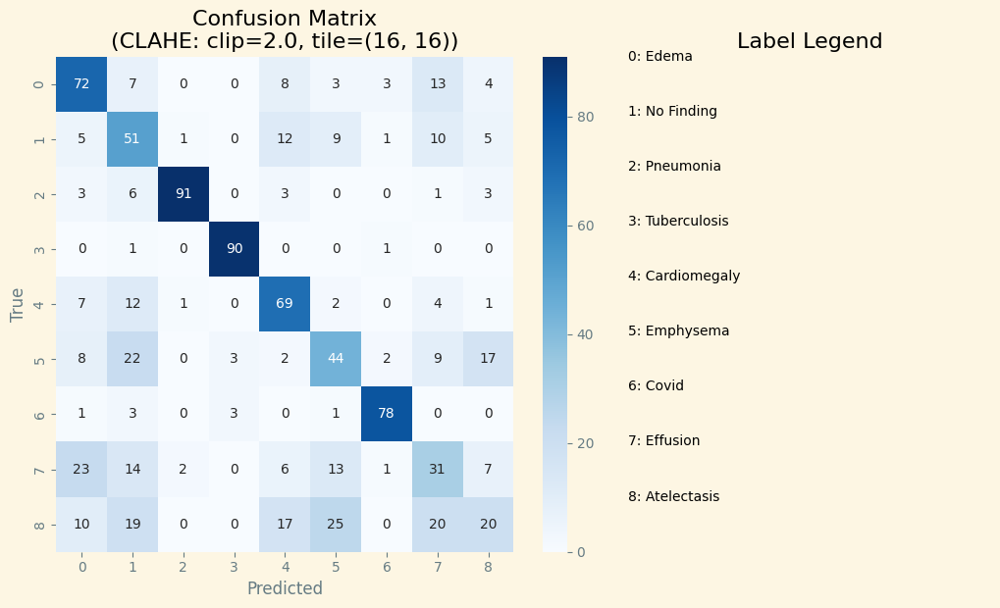

Testing with CLAHE settings: clip_2.0_tile_32x32
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_32x32 = 0.6255555555555555
F1 Score for Test Set with CLAHE settings clip_2.0_tile_32x32 = 0.6321144879611236


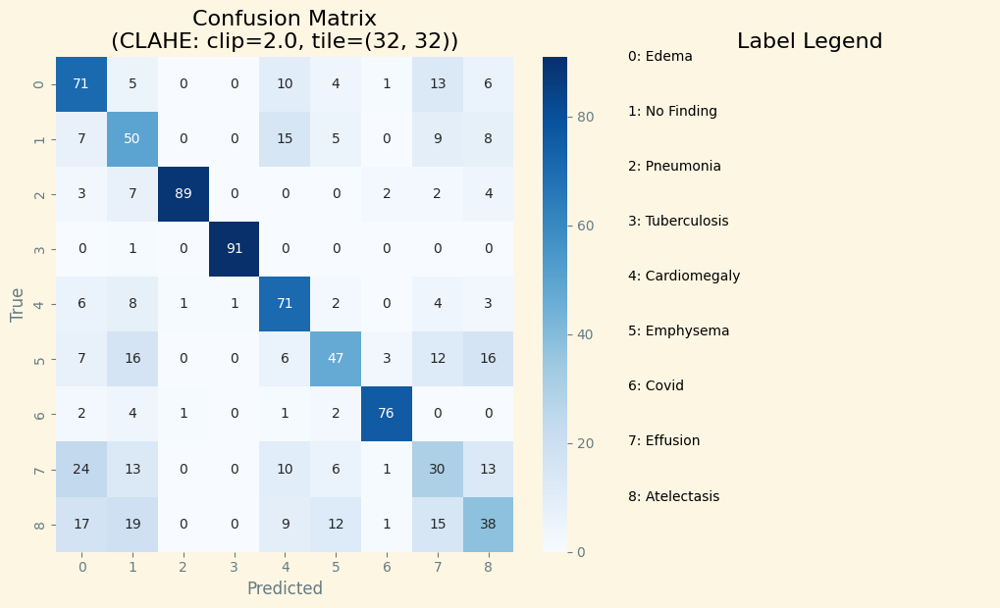

Testing with CLAHE settings: clip_2.5_tile_4x4
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.5_tile_4x4 = 0.6511111111111111
F1 Score for Test Set with CLAHE settings clip_2.5_tile_4x4 = 0.6551333870746232


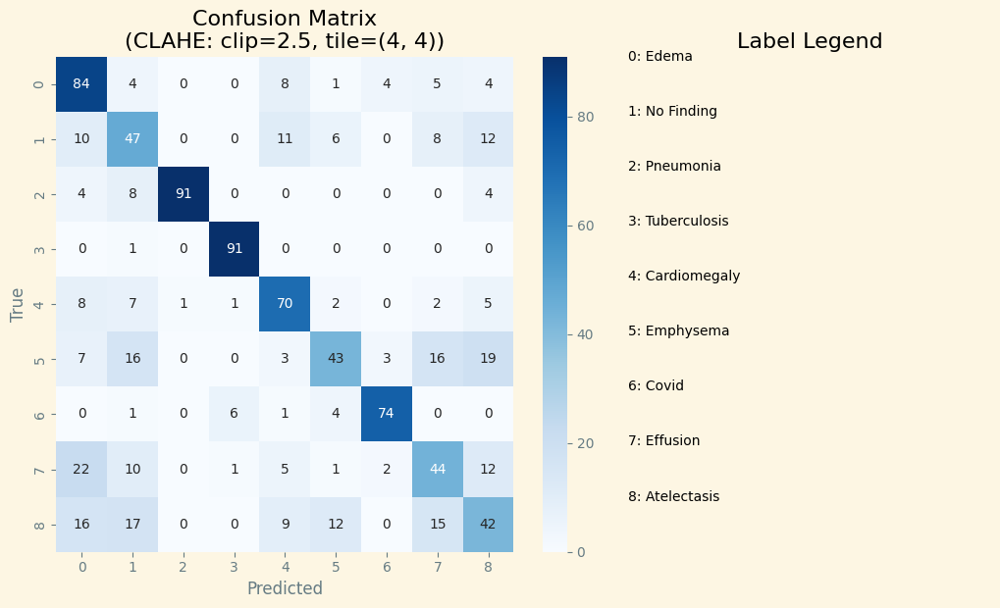

Testing with CLAHE settings: clip_2.5_tile_8x8
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.5_tile_8x8 = 0.6311111111111111
F1 Score for Test Set with CLAHE settings clip_2.5_tile_8x8 = 0.6382646095550188


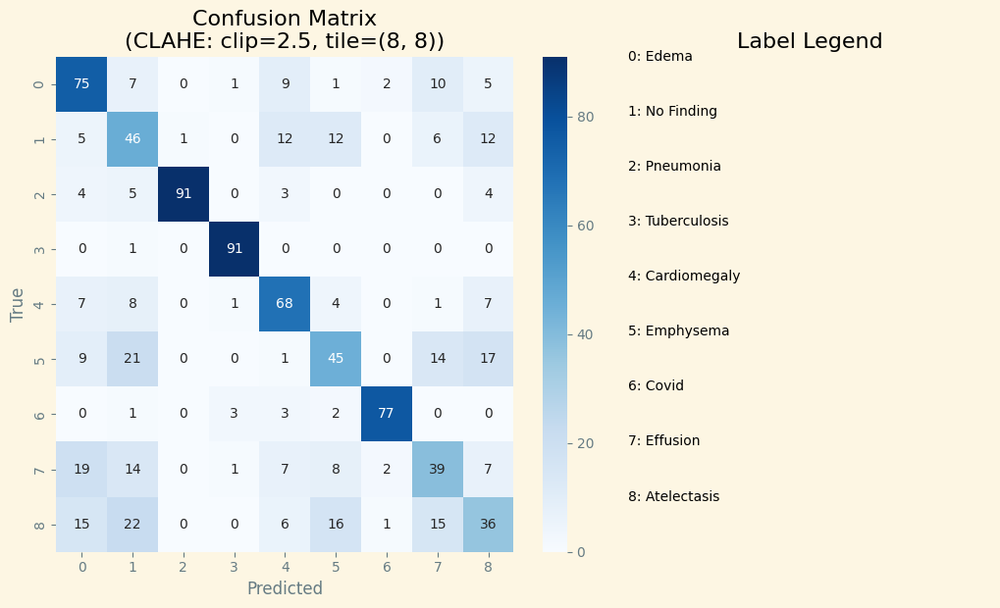

Testing with CLAHE settings: clip_2.5_tile_16x16
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.5_tile_16x16 = 0.6366666666666667
F1 Score for Test Set with CLAHE settings clip_2.5_tile_16x16 = 0.6429323097909572


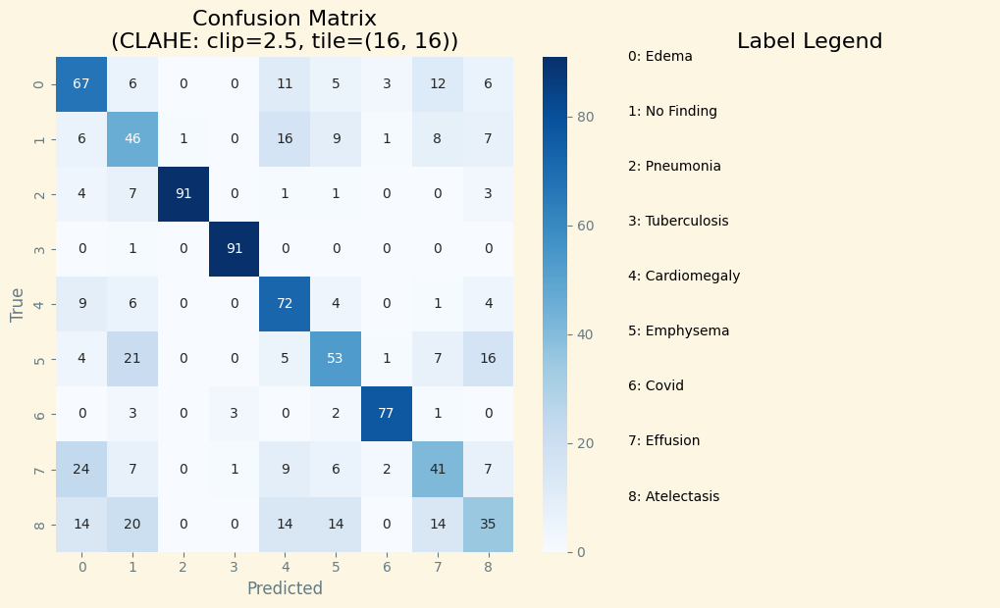

Testing with CLAHE settings: clip_2.5_tile_32x32
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.5_tile_32x32 = 0.6422222222222222
F1 Score for Test Set with CLAHE settings clip_2.5_tile_32x32 = 0.6525958116767802


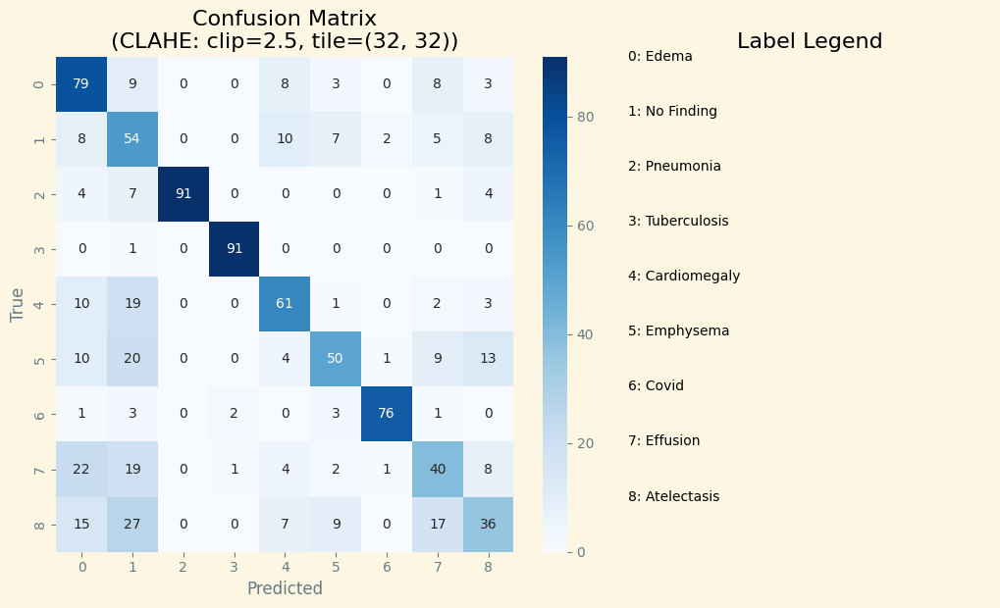

Testing with CLAHE settings: clip_3.0_tile_4x4
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.0_tile_4x4 = 0.6388888888888888
F1 Score for Test Set with CLAHE settings clip_3.0_tile_4x4 = 0.6339806999752616


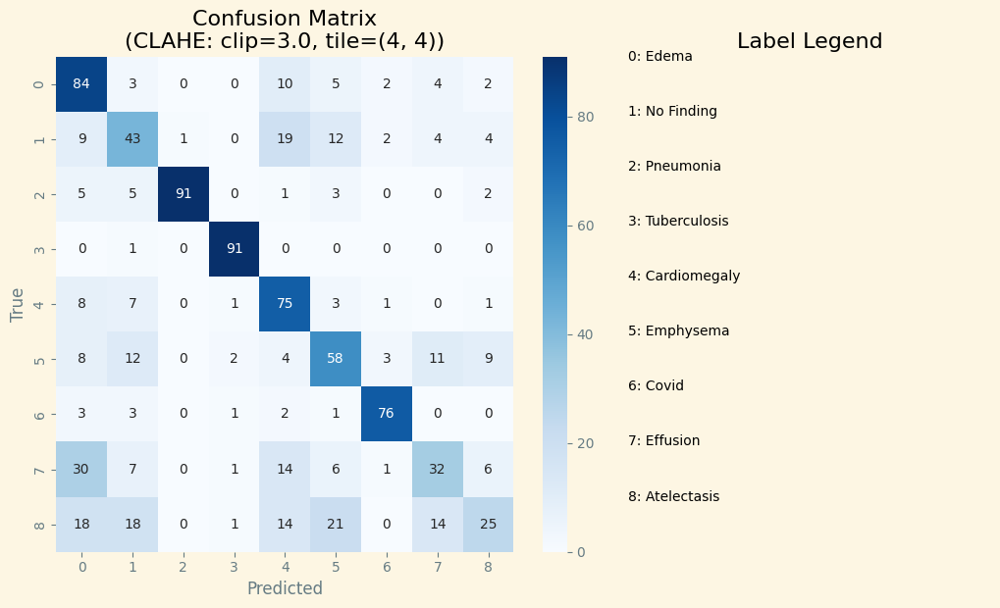

Testing with CLAHE settings: clip_3.0_tile_8x8
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.0_tile_8x8 = 0.6666666666666666
F1 Score for Test Set with CLAHE settings clip_3.0_tile_8x8 = 0.6745717148944312


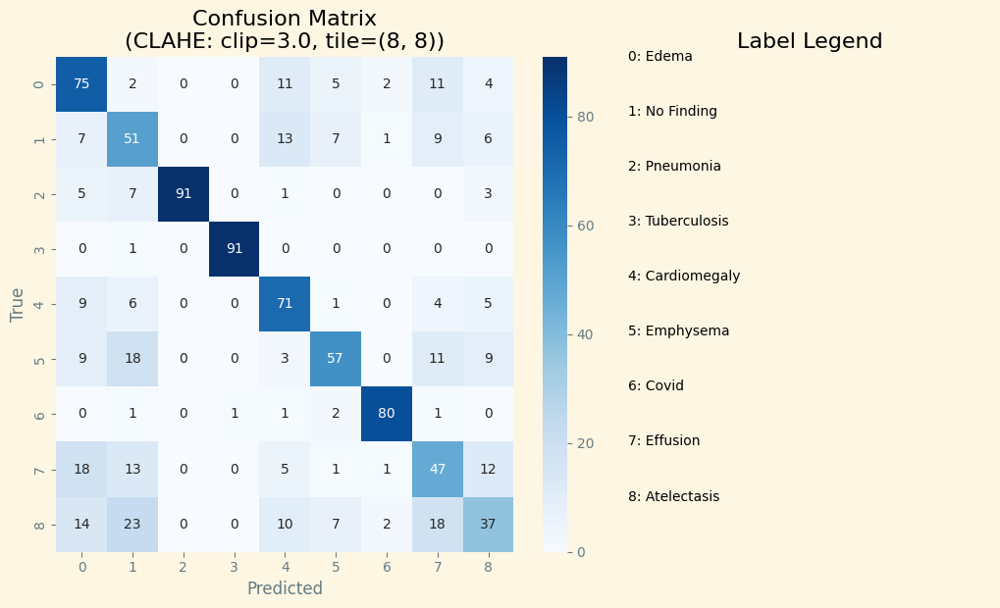

Testing with CLAHE settings: clip_3.0_tile_16x16
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.0_tile_16x16 = 0.6244444444444445
F1 Score for Test Set with CLAHE settings clip_3.0_tile_16x16 = 0.6273854124697604


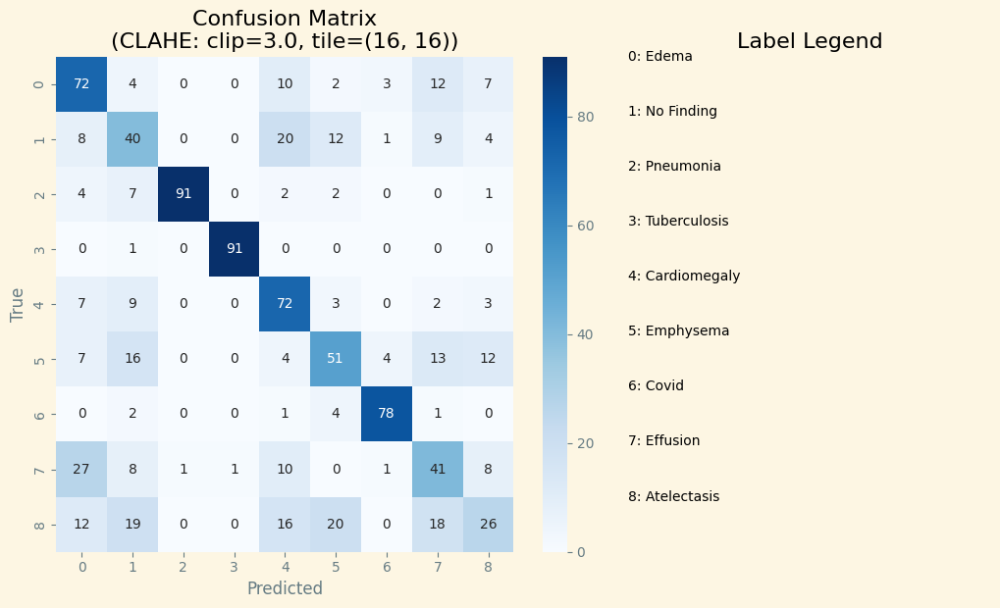

Testing with CLAHE settings: clip_3.0_tile_32x32
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.0_tile_32x32 = 0.6122222222222222
F1 Score for Test Set with CLAHE settings clip_3.0_tile_32x32 = 0.6166554059567962


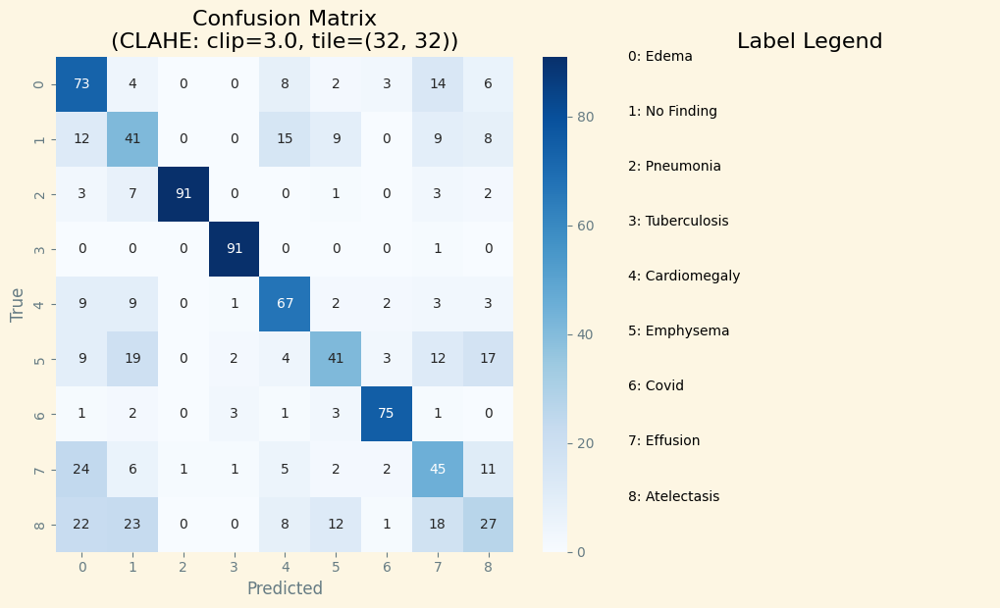

Testing with CLAHE settings: clip_3.5_tile_4x4
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.5_tile_4x4 = 0.6333333333333333
F1 Score for Test Set with CLAHE settings clip_3.5_tile_4x4 = 0.6349008703521289


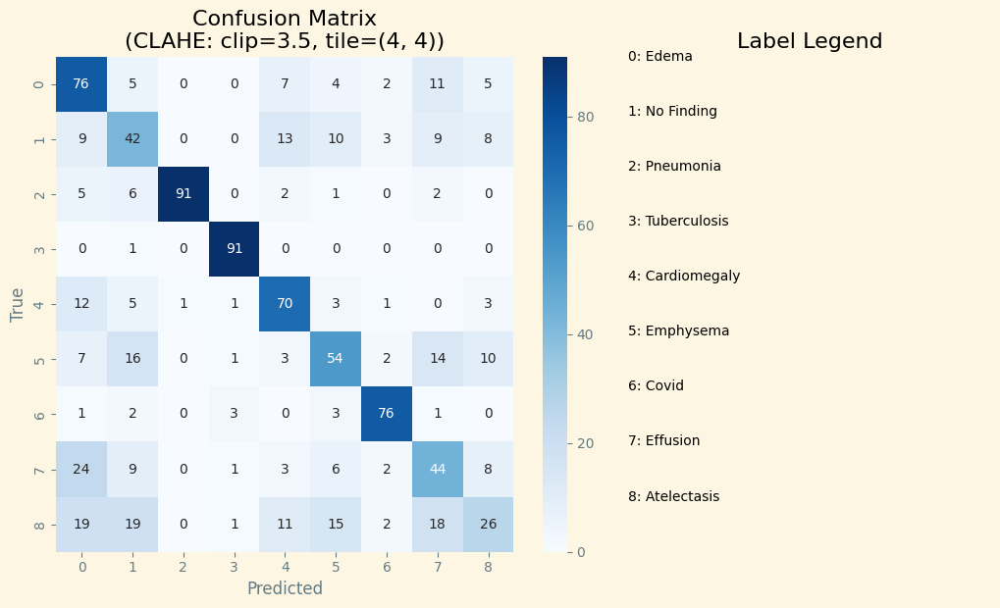

Testing with CLAHE settings: clip_3.5_tile_8x8
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.5_tile_8x8 = 0.6422222222222222
F1 Score for Test Set with CLAHE settings clip_3.5_tile_8x8 = 0.6464332933896921


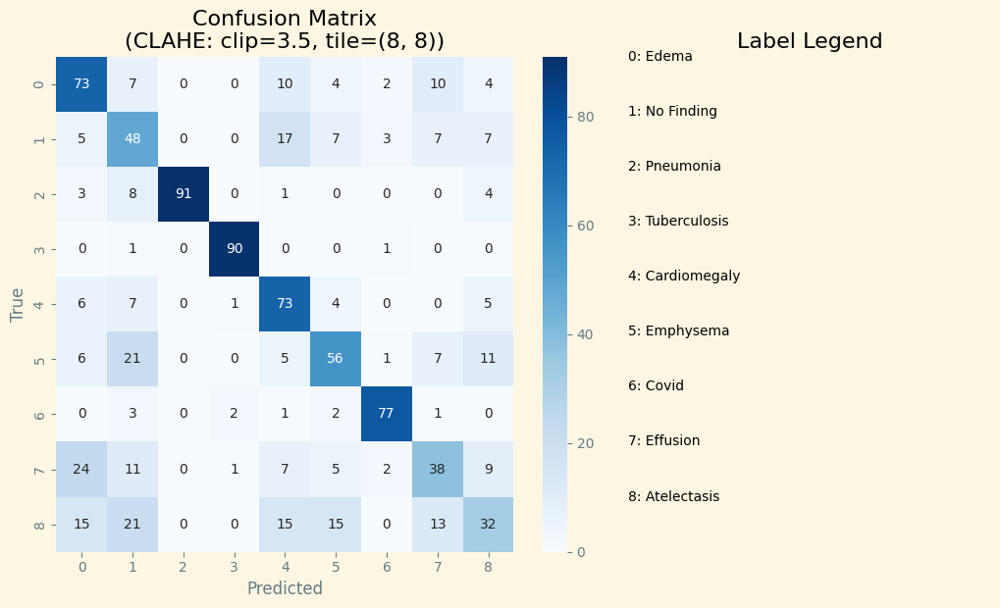

Testing with CLAHE settings: clip_3.5_tile_16x16
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.5_tile_16x16 = 0.6511111111111111
F1 Score for Test Set with CLAHE settings clip_3.5_tile_16x16 = 0.6614350789298896


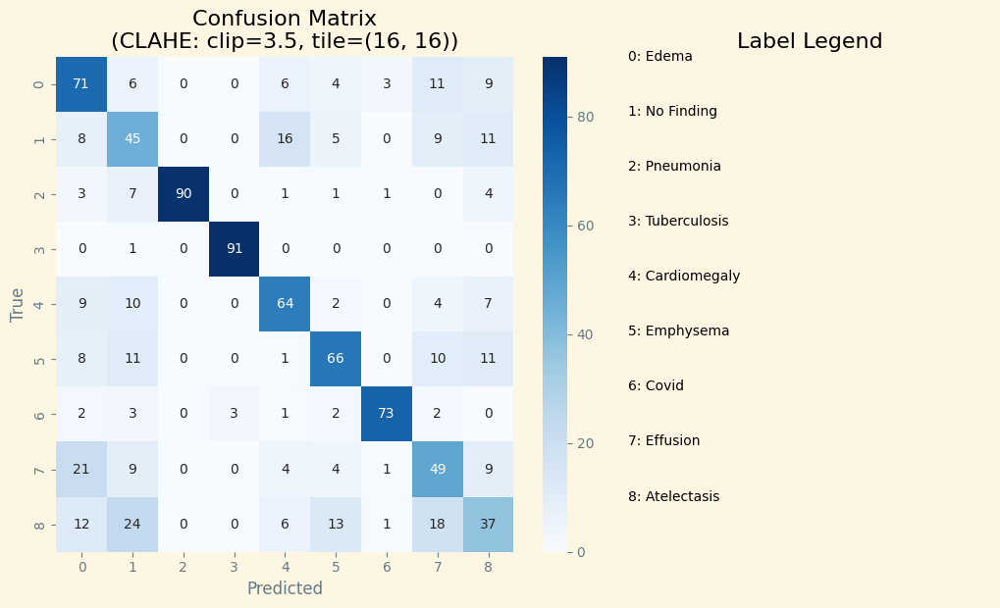

Testing with CLAHE settings: clip_3.5_tile_32x32
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_3.5_tile_32x32 = 0.6377777777777778
F1 Score for Test Set with CLAHE settings clip_3.5_tile_32x32 = 0.6391942370931791


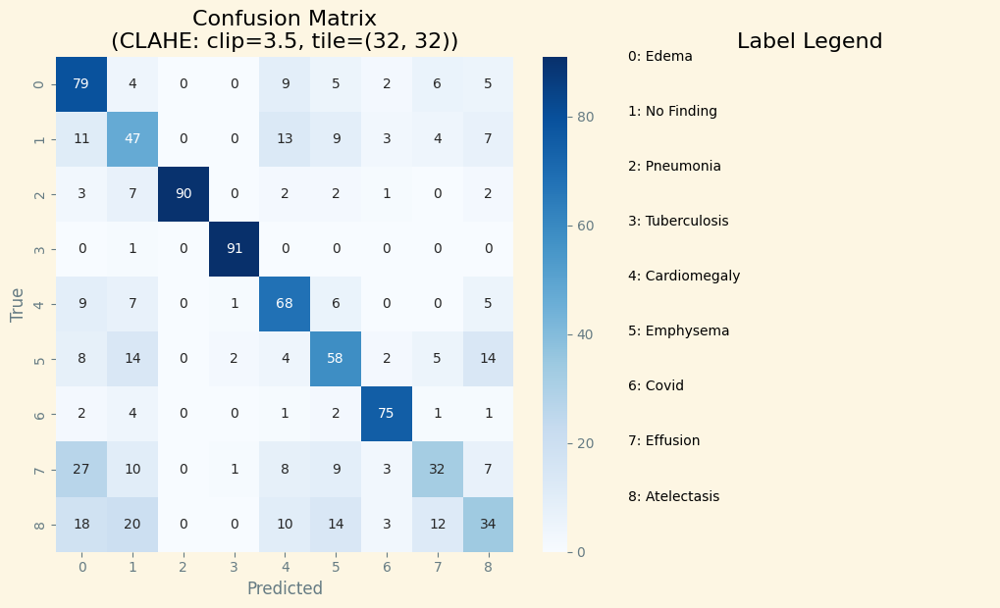

Testing with CLAHE settings: clip_4.0_tile_4x4
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_4.0_tile_4x4 = 0.6255555555555555
F1 Score for Test Set with CLAHE settings clip_4.0_tile_4x4 = 0.6289502451507929


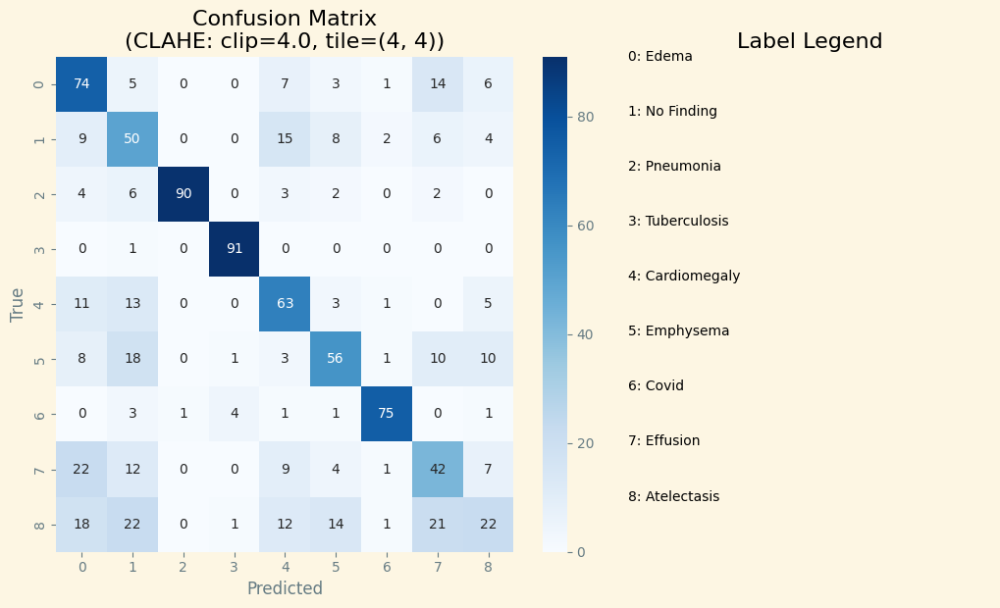

Testing with CLAHE settings: clip_4.0_tile_8x8
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_4.0_tile_8x8 = 0.6244444444444445
F1 Score for Test Set with CLAHE settings clip_4.0_tile_8x8 = 0.6303254242502386


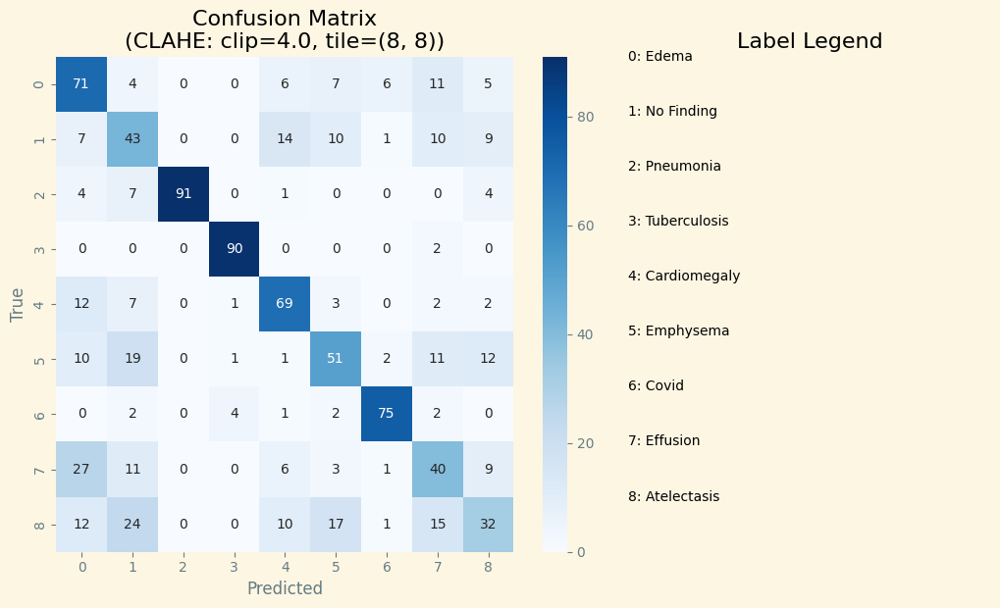

Testing with CLAHE settings: clip_4.0_tile_16x16
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Accuracy for Test Set with CLAHE settings clip_4.0_tile_16x16 = 0.6188888888888889
F1 Score for Test Set with CLAHE settings clip_4.0_tile_16x16 = 0.6232431228848712


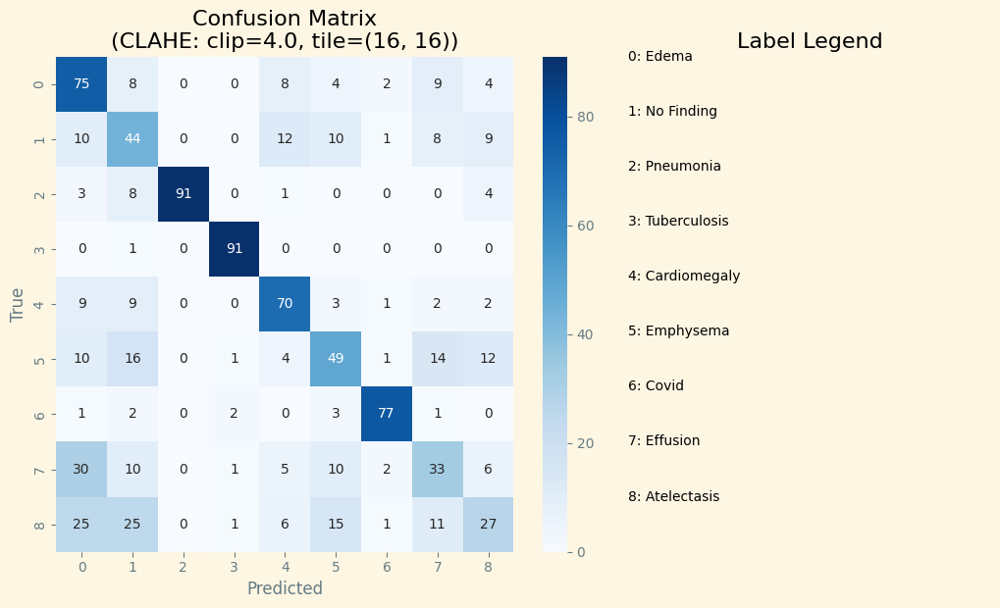

Testing with CLAHE settings: clip_4.0_tile_32x32
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_4.0_tile_32x32 = 0.6255555555555555
F1 Score for Test Set with CLAHE settings clip_4.0_tile_32x32 = 0.6334861564736227


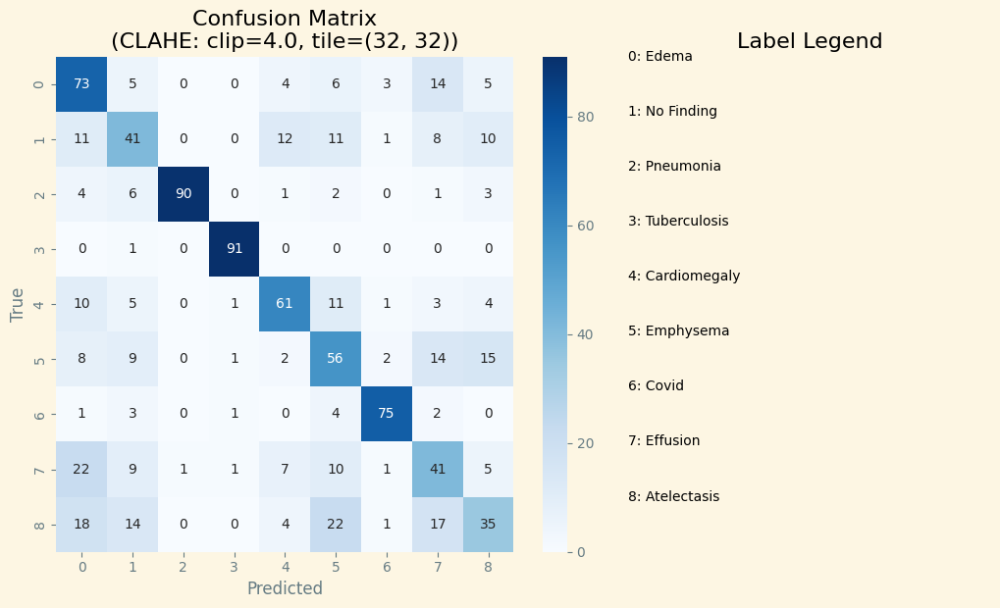

Final Test Results:
CLAHE setting: clip_2.0_tile_4x4
Accuracy: 0.6311
F1 Score: 0.6320
---
CLAHE setting: clip_2.0_tile_8x8
Accuracy: 0.6600
F1 Score: 0.6658
---
CLAHE setting: clip_2.0_tile_16x16
Accuracy: 0.6067
F1 Score: 0.6073
---
CLAHE setting: clip_2.0_tile_32x32
Accuracy: 0.6256
F1 Score: 0.6321
---
CLAHE setting: clip_2.5_tile_4x4
Accuracy: 0.6511
F1 Score: 0.6551
---
CLAHE setting: clip_2.5_tile_8x8
Accuracy: 0.6311
F1 Score: 0.6383
---
CLAHE setting: clip_2.5_tile_16x16
Accuracy: 0.6367
F1 Score: 0.6429
---
CLAHE setting: clip_2.5_tile_32x32
Accuracy: 0.6422
F1 Score: 0.6526
---
CLAHE setting: clip_3.0_tile_4x4
Accuracy: 0.6389
F1 Score: 0.6340
---
CLAHE setting: clip_3.0_tile_8x8
Accuracy: 0.6667
F1 Score: 0.6746
---
CLAHE setting: clip_3.0_tile_16x16
Accuracy: 0.6244
F1 Score: 0.6274
---
CLAHE setting: clip_3.0_tile_32x32
Accuracy: 0.6122
F1 Score: 0.6167
---
CLAHE setting: clip_3.5_tile_4x4
Accuracy: 0.6333
F1 Score: 0.6349
---
CLAHE setting: clip_3.5_tile_8x8
Accuracy: 0.

In [30]:
# 테스트 결과를 저장할 딕셔너리
test_results = {}

for clahe_setting in clahe_settings:
    setting_key = f"clip_{clahe_setting['clip_limit']}_tile_{clahe_setting['tile_grid_size'][0]}x{clahe_setting['tile_grid_size'][1]}"
    print(f"Testing with CLAHE settings: {setting_key}")
    
    preds = []
    model = build_model()

    ## No TTA
    test_gen = DataGenerator(df_test, shuffle=False, batch_size=64, preprocess=preprocess_input,
                             clahe_clip_limit=clahe_setting['clip_limit'], 
                             clahe_tile_grid_size=clahe_setting['tile_grid_size'])

    for i in range(1):
        print(f'Fold {i+1}') 
        if LOAD_MODELS_FROM:
            model.load_weights(f'{LOAD_MODELS_FROM}ResNet_f{i}_{setting_key}.weights.h5')
        else: 
            model.load_weights(f'ResNet_f{i}_{setting_key}.weights.h5')

        pred = model.predict(test_gen, verbose=1) 
        preds.append(pred)
    
    pred_res = np.mean(preds, axis=0)
    
    # Accuracy 
    accuracy = accuracy_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1))
    print(f'Accuracy for Test Set with CLAHE settings {setting_key} =', accuracy)

    # F1 Score 
    f1 = f1_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1), average='macro') 
    print(f'F1 Score for Test Set with CLAHE settings {setting_key} =', f1)

    # Confusion Matrix
    create_confusion_matrix(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1), TARGET, clahe_setting['clip_limit'], clahe_setting['tile_grid_size'])

    # 결과를 딕셔너리에 저장
    test_results[setting_key] = {
        'accuracy': accuracy,
        'f1_score': f1,
        'predictions': pred_res
    }

# 최종 테스트 결과 출력
print("Final Test Results:")
for setting, result in test_results.items():
    print(f"CLAHE setting: {setting}")
    print(f"Accuracy: {result['accuracy']:.4f}")
    print(f"F1 Score: {result['f1_score']:.4f}")
    print("---")


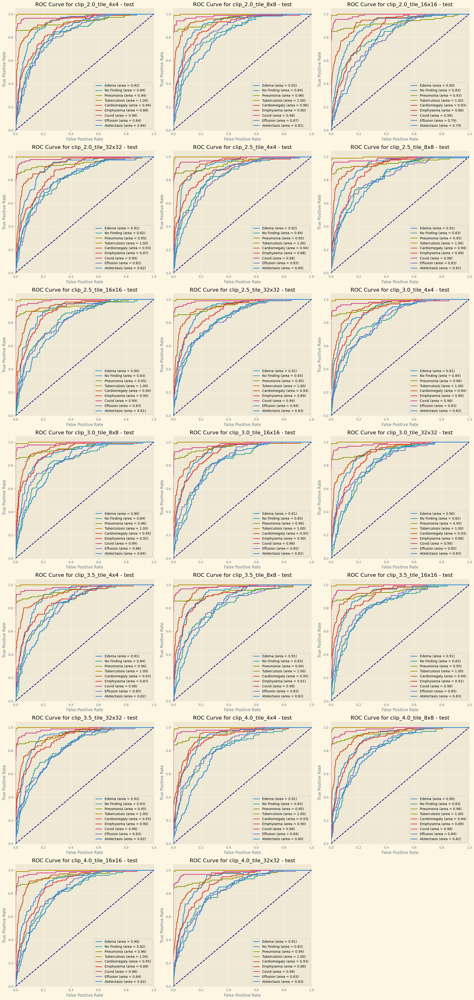

In [31]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

# CLAHE 설정의 수에 따라 subplot 크기 조정
num_settings = len(test_results)
num_cols = 3  # 한 줄에 3개씩 배치
num_rows = (num_settings + num_cols - 1) // num_cols  # 행의 수 계산

fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 6 * num_rows))
axs = axs.flatten()  # 인덱싱을 쉽게 하기 위해 1D 배열로 변환

for idx, (setting_key, test_result) in enumerate(test_results.items()):
    pred_res = test_result['predictions']  # 해당 설정의 예측 결과 불러오기
    
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    axs[idx].set_title(f'ROC Curve for {setting_key} - test')
    
    for i in range(len(TARGET)):
        fpr[i], tpr[i], _ = roc_curve(df_test[TARGET[i]], pred_res[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        axs[idx].plot(fpr[i], tpr[i], lw=2,
                      label=f'{TARGET[i]} (area = {roc_auc[i]:0.2f})')
    
    axs[idx].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    axs[idx].set_xlim([0.0, 1.0])
    axs[idx].set_ylim([0.0, 1.05])
    axs[idx].set_xlabel('False Positive Rate')
    axs[idx].set_ylabel('True Positive Rate')
    axs[idx].legend(loc="lower right")

# 빈 플롯이 생길 수 있으므로 제거
for j in range(idx + 1, num_rows * num_cols):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

#### TTA
___

In [32]:
# 결과를 저장할 딕셔너리
tta_test_results = {}

for clahe_setting in clahe_settings:
    setting_key = f"clip_{clahe_setting['clip_limit']}_tile_{clahe_setting['tile_grid_size'][0]}x{clahe_setting['tile_grid_size'][1]}"
    print(f"Testing with CLAHE settings: {setting_key}")
    
    preds = []
    model = build_model()

    ## No TTA
    test_gen = DataGenerator(df_test, shuffle=False, augment1=True, batch_size=64, preprocess=preprocess_input,
                             clahe_clip_limit=clahe_setting['clip_limit'], 
                             clahe_tile_grid_size=clahe_setting['tile_grid_size'])

    for i in range(1):
        print(f'Fold {i+1}') 
        if LOAD_MODELS_FROM:
            model.load_weights(f'{LOAD_MODELS_FROM}ResNet_f{i}_{setting_key}.weights.h5')
        else: 
            model.load_weights(f'ResNet_f{i}_{setting_key}.weights.h5')
    
        pred = model.predict(test_gen, verbose=1) 
        preds.append(pred)
    
    pred_res = np.mean(preds, axis=0)
    
    # Accuracy 
    accuracy = accuracy_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1))
    print(f'Accuracy for Test Set with CLAHE settings {setting_key} =', accuracy)

    # F1 Score 
    f1 = f1_score(np.argmax(df_test[TARGET].values, axis=1), np.argmax(pred_res, axis=1), average='macro') 
    print(f'F1 Score for Test Set with CLAHE settings {setting_key} =', f1)
    
    # 결과를 딕셔너리에 저장
    tta_test_results[setting_key] = {
        'accuracy': accuracy,
        'f1_score': f1,
        'predictions': pred_res
    }

# 최종 테스트 결과 출력
print("Final Test Results:")
for setting, tta_result in tta_test_results.items():
    print(f"CLAHE setting: {setting}")
    print(f"Accuracy: {tta_result['accuracy']:.4f}")
    print(f"F1 Score: {tta_result['f1_score']:.4f}")
    print("---")
print('TTA_Test')
tta_results_df = pd.DataFrame(tta_test_results)
tta_results_df

Testing with CLAHE settings: clip_2.0_tile_4x4
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_4x4 = 0.6488888888888888
F1 Score for Test Set with CLAHE settings clip_2.0_tile_4x4 = 0.6512445345251162
Testing with CLAHE settings: clip_2.0_tile_8x8
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_8x8 = 0.6633333333333333
F1 Score for Test Set with CLAHE settings clip_2.0_tile_8x8 = 0.6710520767801958
Testing with CLAHE settings: clip_2.0_tile_16x16
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_16x16 = 0.6222222222222222
F1 Score for Test Set with CLAHE settings clip_2.0_tile_16x16 = 0.6236919474038018
Testing with CLAHE settings: clip_2.0_tile_32x32
Fold 1
15/15 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step
Accuracy for Test Set with CLAHE settings clip_2.0_tile_32x32 = 0.6255555555555555
F1 Score for Test Set with CLAHE settings clip_2.0_

,clip_2.0_tile_4x4,clip_2.0_tile_8x8,clip_2.0_tile_16x16,clip_2.0_tile_32x32,clip_2.5_tile_4x4,clip_2.5_tile_8x8,clip_2.5_tile_16x16,clip_2.5_tile_32x32,clip_3.0_tile_4x4,clip_3.0_tile_8x8,clip_3.0_tile_16x16,clip_3.0_tile_32x32,clip_3.5_tile_4x4,clip_3.5_tile_8x8,clip_3.5_tile_16x16,clip_3.5_tile_32x32,clip_4.0_tile_4x4,clip_4.0_tile_8x8,clip_4.0_tile_16x16,clip_4.0_tile_32x32
accuracy,0.648889,0.663333,0.622222,0.625556,0.645556,0.623333,0.641111,0.653333,0.638889,0.667778,0.624444,0.601111,0.644444,0.638889,0.655556,0.644444,0.626667,0.63,0.615556,0.628889
f1_score,0.651245,0.671052,0.623692,0.631165,0.649723,0.629153,0.648177,0.66249,0.639662,0.674251,0.630601,0.605523,0.64642,0.641102,0.664221,0.646457,0.632362,0.630829,0.619828,0.638294
predictions,"[[0.020193154, 0.047832474, 0.021023385, 0.017...","[[0.01372491, 0.069251746, 0.009913145, 0.0177...","[[0.039138965, 0.22385283, 0.05435504, 0.01480...","[[0.022728242, 0.11395158, 0.021416515, 0.0260...","[[0.009998039, 0.036154833, 0.0108911935, 0.00...","[[0.043006435, 0.10257613, 0.022322137, 0.0333...","[[0.028047606, 0.029335236, 0.015124334, 0.009...","[[0.07021472, 0.13749689, 0.038109343, 0.01726...","[[0.122436196, 0.09246355, 0.029221924, 0.0146...","[[0.0035528766, 0.028677624, 0.009312751, 0.00...","[[0.014019706, 0.09816762, 0.012894568, 0.0170...","[[0.036553748, 0.14775674, 0.034315333, 0.0475...","[[0.030893471, 0.20220017, 0.031726617, 0.0146...","[[0.018514756, 0.06239709, 0.03745325, 0.03762...","[[0.02743601, 0.09580517, 0.041677345, 0.02570...","[[0.06097554, 0.092356, 0.036659583, 0.0184781...","[[0.025873657, 0.23745038, 0.029810604, 0.0138...","[[0.018459596, 0.05941094, 0.01899903, 0.02736...","[[0.021062344, 0.16686332, 0.046054512, 0.0081...","[[0.09749619, 0.18101011, 0.06367421, 0.045503..."
